# Anticipez les besoins en consommation de bâtiments - Seattle

## Analyse exploratoire 

#### Contexte :

- Nous travaillons pour la ville de Seattle. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, notre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

- Des relevés minutieux ont été effectués par les agents de la ville en 2016. Cependant, ces relevés sont coûteux à obtenir, et à partir de ceux déjà réalisés, nous voulons tenter de prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments non destinés à l’habitation pour lesquels elles n’ont pas encore été mesurées.

- Dans ce notebook, nous effectuerons le nettoyage, l'analyse et la préparation des données en vue de la modélisation.

# I. Nettoyage des données

Nous allons importer les données et réaliser les différentes étapes de nettoyage pour préparer les données à l'analyse

In [1]:
# Librairies
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings

In [391]:
data = pd.read_csv('2016_Building_Energy_Benchmarking.csv', sep=",")

In [392]:
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [393]:
data.info(verbose=True) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

## 1.  Sélection des variables

### 1.a  Taux de complétion

Visualisons le taux de complétion des colonnes du Data set

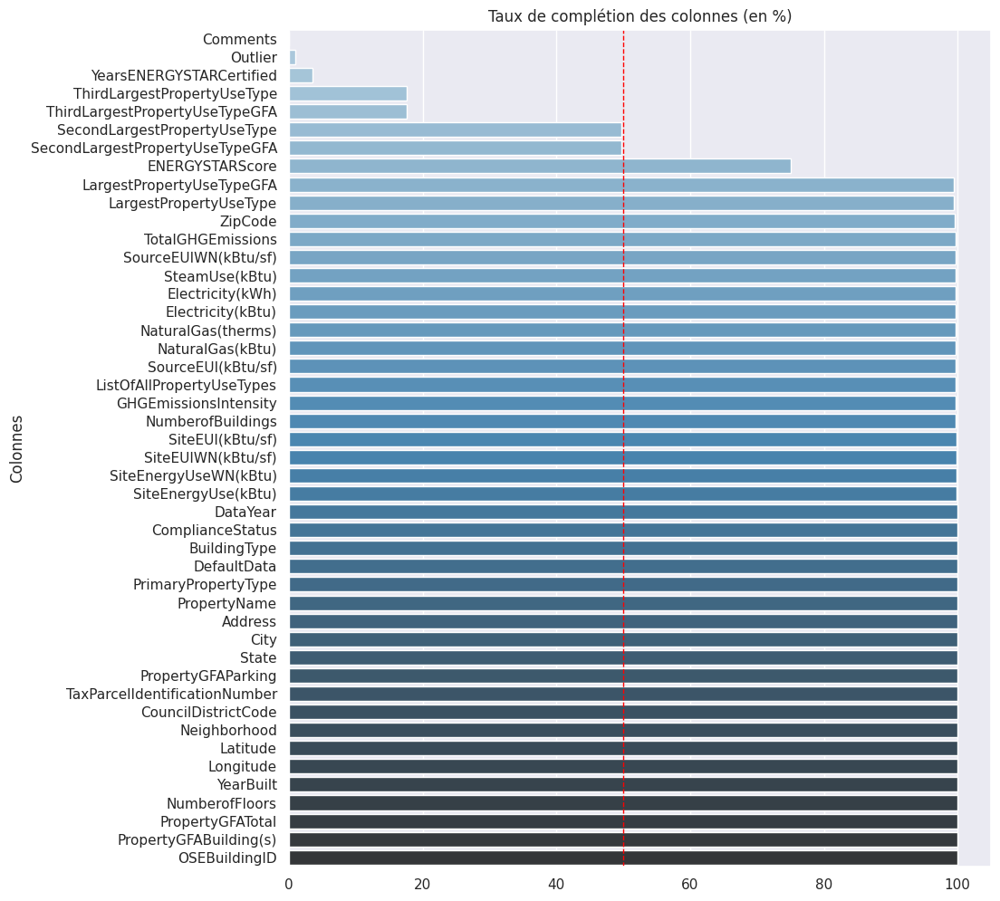

In [394]:
warnings.filterwarnings("ignore")
sns.set()
completion = (data.count().divide(data.shape[0])*100).sort_values()
plt.figure(figsize=(10, 12))
ax = sns.barplot(y = completion.index, x=completion.values, palette="Blues_d")
plt.title('Taux de complétion des colonnes (en %)')
plt.ylabel('Colonnes')
ax.axvline(x=50, color='red', linestyle='--', linewidth=1)
plt.show()

Nous constatons que les colonnes suivantes ont un taux de complétion inférieur à 50% :

    - Comments
    - Outlier
    - YearsENERGYSTARCertified
    - ThirdLargestPropertyUseType
    - ThirdLargestPropertyUseTypeGFA
    - SecondLargestPropertyUseType
    - SecondLargestPropertyUseTypeGFA

Nous allons dans un premier temps filtrer les colonnes par taux de complétion, supprimons les colonnes citées ci-dessus, à l'exception de la colonne Outlier

In [395]:
# Suppression des colonnes dont le taux de complétion est inférieur à 50%

to_drop = ["Comments", "YearsENERGYSTARCertified", "ThirdLargestPropertyUseType", "ThirdLargestPropertyUseTypeGFA", 
           "SecondLargestPropertyUseType", "SecondLargestPropertyUseTypeGFA"]

print('Le nombre de colonnes avant suppression :', data.shape[1])
filtred_data = data.drop(to_drop, axis=1)
print('Le nombre de colonnes après suppression :',filtred_data.shape[1])

Le nombre de colonnes avant suppression : 46
Le nombre de colonnes après suppression : 40


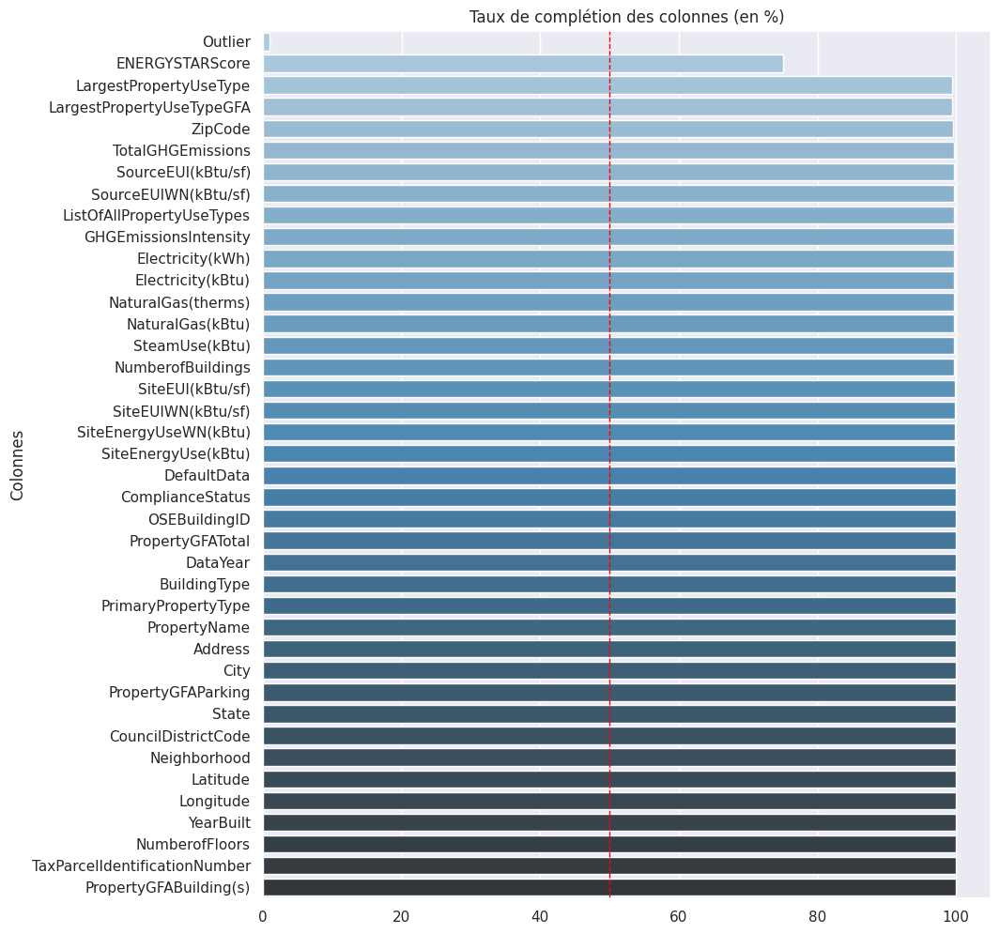

In [396]:
# Revisualisation après suppressions des colonnes

warnings.filterwarnings("ignore")
completion = (filtred_data.count().divide(filtred_data.shape[0])*100).sort_values()
plt.figure(figsize=(10, 12))
ax = sns.barplot(y = completion.index, x=completion.values, palette="Blues_d")
plt.title('Taux de complétion des colonnes (en %)')
plt.ylabel('Colonnes')
ax.axvline(x=50, color='red', linestyle='--', linewidth=1)
plt.show()

A l'exception des variables Outlier et ENERGYSTARScore, les variables restantes ont un taux de complétion qui avoisine 100%

Nous avons remarqué que nos données contiennt des bâtiments destinés à l'habitation. Or ici, nous voulons préduire la consommation énergitique et l'émissions de CO2 pour les bâtiments non déstinés à l'habitation. Nous allons, par la suite, filtrer sur cette variable.

Commençons par importer les dataset des années 2015 et 2017.

### 1.b Récupération des données de 2015 et 2017 

In [405]:
data_2015 = pd.read_csv('2015_Building_Energy_Benchmarking.csv', sep=",")
data_2017 = pd.read_csv('2017_Building_Energy_Benchmarking.csv', sep=",")

Le dataset de l'année 2015 ne contient pas les colonnes Longitude et Latitude, celles-ci sont regroupées dans la variable Location.

Nous allons créer ces variables (Longitude et Latitude) à partir de la variable Location:

In [406]:
import re

# Fonction pour extraire les coordonnées de la variables Location

location = data_2015.Location

def extract_coordinates(location):
    pattern = r'\((?P<latitude>[-\d.]+), (?P<longitude>[-\d.]+)\)'
    matches = re.search(pattern, location)
    if matches:
        latitude = float(matches.group('latitude'))
        longitude = float(matches.group('longitude'))
        return pd.Series({'Latitude': latitude, 'Longitude': longitude})
    else:
        return pd.Series({'Latitude': None, 'Longitude': None})

# Appliquer la fonction à toutes les lignes du DataFrame
data_2015[['Latitude', 'Longitude']] = data_2015['Location'].apply(extract_coordinates)


Renommer les variables GHGEmissions et GHGEmissionsIntensity pour avoir les mêmes colonnes que l'année 2016.

In [407]:
data_2015 = data_2015.rename(columns={'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions',
                                      'GHGEmissionsIntensity(kgCO2e/ft2)': 'GHGEmissionsIntensity',
                                      })

### 1.c Choix des variables :
A cette étape, nous allons sélectionner les variables à analyser.

#### Variables cibles : 


- SiteEUI(kBtu/sf) : la consommation d'énergie annuelle divisée par la superficie.
- SiteEUIWN(kBtu/sf)
- SourceEUI(kBtu/sf) : la consommation d'énergie à la source divisée par la superficie. 
- SourceEUIWN(kBtu/sf)
- SiteEnergyUse(kBtu) : la consommation d'énergie annuelle.
- SiteEnergyUseWN(kBtu) 
- SteamUse(kBtu) : la quantité de vapeur urbaine consommmée.
- Electricity(kWh) 
- Electricity(kBtu)
- NaturalGas(therms)
- NaturalGas(kBtu)
- TotalGHGEmissions : la quantité totale de gaz à effet de serre
- GHGEmissionsIntensity : la quantité de gaz divisée par la superficie

  
(KBtu : thousand British thermal units - suffixe WN : Weather Normalized) 

Plusieurs variables avec des infromations redondantes, nous allons retenir :
##### - SiteEnergyUse(kBtu) : Consommation énergitique
##### - TotalGHGEmissions : Emissions de CO2


#### Variables explicatives :
- OSEBuilding
- DataYear
- BuildingType
- PrimaryPropertyType
- CouncilDistrictCode
- Neighborhood
- Latitude
- Longitude
- YearBuilt
- NumberofBuildings
- NumberofFloors
- PropertyGFATotal
- PropertyGFAParking
- PropertyGFABuilding(s)
- LargestPropertyUseType
- LargestPropertyUseTypeGFA
- ENERGYSTARScore

filtred_data.columns

In [409]:
selected_columns = ['OSEBuildingID', 
                    'DataYear',
                    'BuildingType',
                    'PrimaryPropertyType',
                    'CouncilDistrictCode',
                    'Neighborhood',
                    'Latitude', 
                    'Longitude', 
                    'YearBuilt',
                    'NumberofBuildings',
                    'NumberofFloors',
                    'PropertyGFATotal',
                    'PropertyGFAParking',
                    'PropertyGFABuilding(s)',
                    'LargestPropertyUseType',
                    'LargestPropertyUseTypeGFA',
                    'ENERGYSTARScore', 
                    'SiteEnergyUse(kBtu)', 
                    'TotalGHGEmissions', 
                    'Outlier'
                   ]


Regroupement des données de 2015 - 2016 et 2017 

In [410]:
df = pd.concat([data_2015[selected_columns], filtred_data[selected_columns], data_2017[selected_columns]], axis=0, ignore_index=True)
df.shape

(10177, 20)

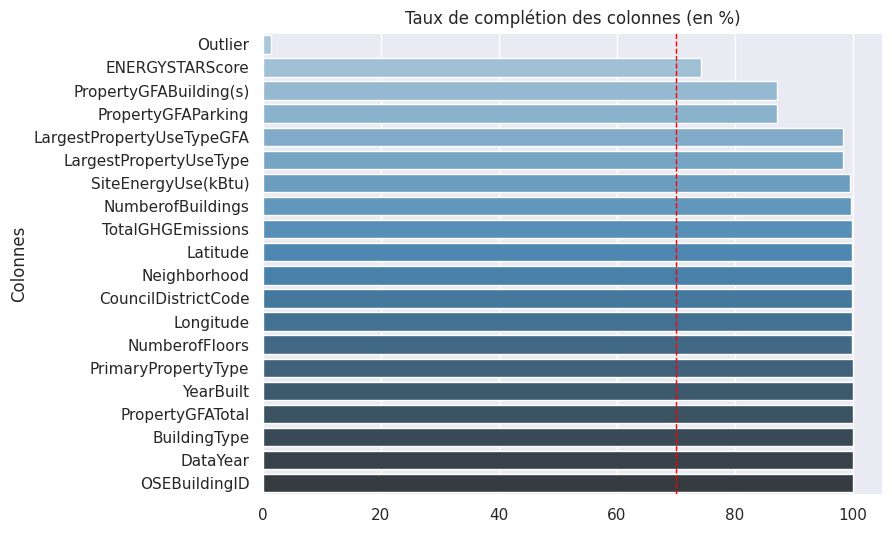

In [411]:
# Revisualisation du taux de complétion des colonnes

warnings.filterwarnings("ignore")
completion = (df.count().divide(df.shape[0])*100).sort_values()
plt.figure(figsize=(8, 6))
ax = sns.barplot(y = completion.index, x=completion.values, palette="Blues_d")
plt.title('Taux de complétion des colonnes (en %)')
plt.ylabel('Colonnes')
ax.axvline(x=70, color='red', linestyle='--', linewidth=1)
plt.show()

In [414]:
df.to_csv('data_concat.csv', index=False)

In [8]:
concat = pd.read_csv('data_concat.csv', sep=",")

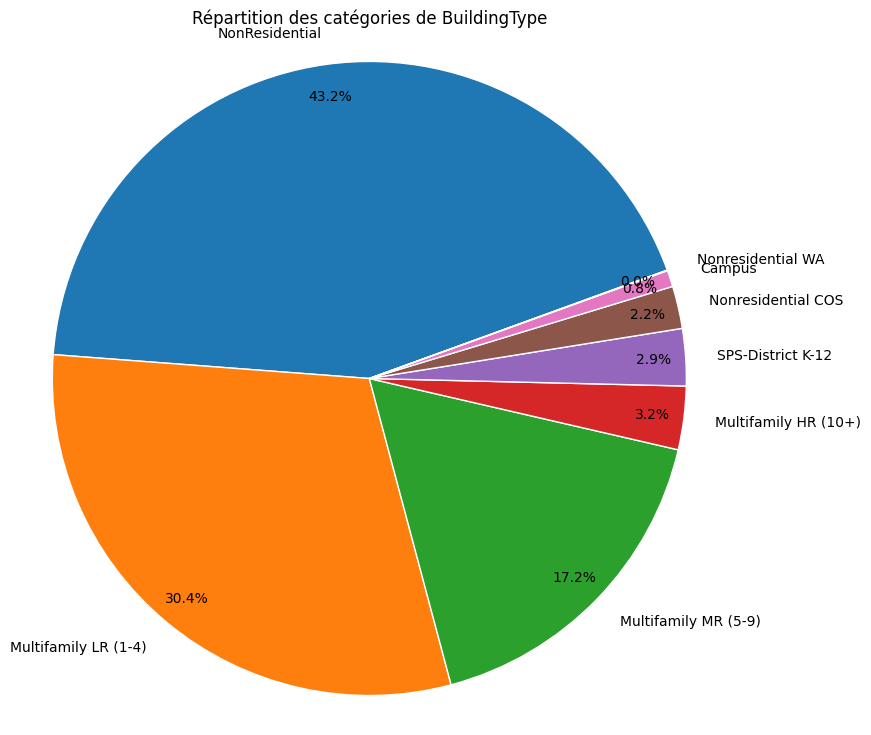

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,9))
plt.pie(concat['BuildingType'].value_counts(), 
        labels=concat['BuildingType'].value_counts().index, autopct='%1.1f%%',pctdistance = 0.9, #labeldistance = 1.25,
        startangle=20, wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' },)
plt.axis('equal') 
plt.title('Répartition des catégories de BuildingType')
plt.show()
# print(df.BuildingType.value_counts())

## 2. Nettoyage

In [435]:
for column in df.columns:
    if df[column].nunique()<10:
        print('Colonne {}, valeurs uniques :\n{}\n'.format(column, df[column].unique()))
    else:
        print('Colonne {}, {} valeurs uniques'.format(column, df[column].nunique()))



Colonne OSEBuildingID, 3526 valeurs uniques
Colonne DataYear, valeurs uniques :
[2015 2016 2017]

Colonne BuildingType, valeurs uniques :
['Multifamily LR (1-4)' 'NonResidential' 'Multifamily HR (10+)'
 'SPS-District K-12' 'Multifamily MR (5-9)' 'Campus' 'Nonresidential COS'
 'Nonresidential WA']

Colonne PrimaryPropertyType, 32 valeurs uniques
Colonne CouncilDistrictCode, valeurs uniques :
[ 7.  2.  3.  1.  6.  5.  4. nan]

Colonne Neighborhood, 20 valeurs uniques
Colonne Latitude, 6226 valeurs uniques
Colonne Longitude, 5963 valeurs uniques
Colonne YearBuilt, 115 valeurs uniques
Colonne NumberofBuildings, 20 valeurs uniques
Colonne NumberofFloors, 50 valeurs uniques
Colonne PropertyGFATotal, 3446 valeurs uniques
Colonne PropertyGFAParking, 1039 valeurs uniques
Colonne PropertyGFABuilding(s), 3882 valeurs uniques
Colonne LargestPropertyUseType, 100 valeurs uniques
Colonne LargestPropertyUseTypeGFA, 3676 valeurs uniques
Colonne ENERGYSTARScore, 100 valeurs uniques
Colonne SiteEnergyUse

### 2.a Nettoyage des variables catégorielles :

Corriger les types des variables catégorielles

In [436]:
categories_var=["BuildingType", "PrimaryPropertyType", "Neighborhood", "LargestPropertyUseType", "CouncilDistrictCode"]
df[categories_var] = df[categories_var].astype('category')

#### BuildingType

In [437]:
df.BuildingType.unique()

['Multifamily LR (1-4)', 'NonResidential', 'Multifamily HR (10+)', 'SPS-District K-12', 'Multifamily MR (5-9)', 'Campus', 'Nonresidential COS', 'Nonresidential WA']
Categories (8, object): ['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']

On va regrouper les catégories multyfamily en vue de les supprimer cette catégorie par la suite.

In [438]:
categories_dict = {
    'Multifamily MR (5-9)': 'Multifamily',
    'Multifamily LR (1-4)': 'Multifamily',
    'Multifamily HR (10+)': 'Multifamily',
}

# Regrouper les catégories
df['BuildingType'] = df['BuildingType'].replace(categories_dict)

unique_categories = df['BuildingType'].unique().tolist()
print(unique_categories)

['Multifamily', 'NonResidential', 'SPS-District K-12', 'Campus', 'Nonresidential COS', 'Nonresidential WA']


#### PrimaryPropertyType - LargestPropertyUseType

In [421]:
df.PrimaryPropertyType.unique()

['Low-Rise Multifamily', 'Hotel', 'High-Rise Multifamily', 'Supermarket/Grocery Store', 'K-12 School', ..., 'Warehouse', 'Residence Hall', 'Supermarket / Grocery Store', 'Office', NaN]
Length: 33
Categories (32, object): ['College/University', 'Distribution Center', 'Distribution Center\n', 'High-Rise Multifamily', ..., 'Supermarket/Grocery Store', 'University', 'Warehouse', 'Worship Facility']

In [442]:
# Regrouper les catégories des deux variables via un dictionnaire


property_type_dict = {
    'Low-Rise Multifamily': 'Housing/Hotel',
    'Hotel': 'Housing/Hotel',
    'High-Rise Multifamily': 'Housing/Hotel',
    'Senior Care Community': 'Housing/Hotel',
    'Residence Hall/Dormitory': 'Housing/Hotel',
    'Mid-Rise Multifamily': 'Housing/Hotel',
    'Residence Hall': 'Housing/Hotel',
    'Other - Lodging/Residential': 'Housing/Hotel',
    'Multifamily Housing': 'Housing/Hotel',
    'Multifamily': 'Housing/Hotel',
    'Residential Care Facility': 'Housing/Hotel',
    'Senior Care': 'Housing/Hotel',
    'Residence H': 'Housing/Hotel',
    'Residential': 'Housing/Hotel',

    'Supermarket/Grocery Store': 'Retail',    
    'Supermarket / Grocery Store': 'Retail',
    'Automobile Dealership': 'Retail',
    'Retail Store': 'Retail',
    'Strip Mall': 'Retail',
    'Wholesale Club/Supercenter': 'Retail',
    'Other - Mall': 'Retail',
    'Other - Utility': 'Retail',
    'Automobile': 'Retail',
    'Repair Services (Vehicle, Shoe, Locksmith, etc)' : 'Retail',
    'Other - Mal': 'Retail',
    'Retail Stor': 'Retail',
    'Repair Serv': 'Retail',
    'Supermarket': 'Retail',
    'Wholesale C': 'Retail',
    
    'Distribution Center\n': 'Distribution',
    'Distribution Center': 'Distribution',
    'Distributio': 'Distribution',
    
    'Medical Office': 'Health',
    'Hospital': 'Health',
    'Laboratory': 'Health',
    'Hospital (General Medical & Surgical)': 'Health',
    'Urgent Care/Clinic/Other Outpatient': 'Health',
    'Other/Specialty Hospital': 'Health',
    'Outpatient Rehabilitation/Physical Therapy': 'Health',
    'Medical Off': 'Health',
    'Hospital (G': 'Health',
    'Urgent Care': 'Health',

    'College/University': 'Education',
    'K-12 School': 'Education',
    'University': 'Education',
    'Library': 'Education',
    'Other - Education': 'Education',
    'Adult Education': 'Education',
    'Pre-school/Daycare': 'Education',
    'College/Uni' : 'Education',
    'Pre-school/': 'Education',
    'Adult Educa': 'Education',
    'Other - Edu': 'Education',

    'Office': 'Office',
    'Large Office': 'Office',
    'Other - Services': 'Office',
    'Small- and Mid-Sized Office': 'Office',
    'Financial Office': 'Office',
    'Bank Branch': 'Office',
    'Financial O': 'Office',
    
    'Courthouse': 'Public services',
    'Police Station': 'Public services',
    'Police Stat': 'Public services',
    'Other - Public Services': 'Public services',
    'Other - Entertainment/Public Assembly': 'Public services',
    'Fire Station': 'Public services',
    'Prison/Incarceration': 'Public services',
    'Fire Statio': 'Public services',
    
    'Restaurant\n': 'Restaurant/Leisure',
    'Restaurant': 'Restaurant/Leisure',
    'Social/Meeting Hall': 'Restaurant/Leisure',
    'Museum': 'Restaurant/Leisure',
    'Fitness Center/Health Club/Gym': 'Restaurant/Leisure',
    'Lifestyle Center': 'Restaurant/Leisure',
    'Performing Arts': 'Restaurant/Leisure',
    'Food Service': 'Restaurant/Leisure',
    'Other - Restaurant/Bar': 'Restaurant/Leisure',
    'Movie Theater': 'Restaurant/Leisure',
    'Fitness Cen': 'Restaurant/Leisure',
    'Social/Meet': 'Restaurant/Leisure',
    'Lifestyle C': 'Restaurant/Leisure',
    'Other - Pub': 'Restaurant/Leisure',
    'Performing': 'Restaurant/Leisure',
    'Food Servic': 'Restaurant/Leisure',
    'Other - Res': 'Restaurant/Leisure',
    'Movie Theat': 'Restaurant/Leisure',
    'Other - Recreation': 'Restaurant/Leisure',
    'Personal Services (Health/Beauty, Dry Cleaning, etc)': 'Restaurant/Leisure', 
    
    'Self-Storage Facility\n' : 'Self-Storage Facility',
    'Self-Storag': 'Self-Storage Facility',

    'Worship Fac': 'Worship Facility',

    'Non-Refrigerated Warehouse': 'Warehouse',
    'Refrigerated Warehouse': 'Warehouse',
    'Non-Refrige': 'Warehouse',
    'Refrigerate': 'Warehouse',

    'Other - Lod': 'Other',
    'Other/Speci': 'Other',
    'Enclosed Ma': 'Other',
    'Convention': 'Other',
    'Other - Ser': 'Other',
    'Manufacturi': 'Other',
    'Other - Ent': 'Other',
    'Other - Rec': 'Other',
    'Other - Uti': 'Other',
    'Personal Se': 'Other',
    'Worship Facility': 'Other',
    'Worship Fac': 'Other',
    
}

# Regrouper les catégories
df['PrimaryPropertyType'] = df['PrimaryPropertyType'].replace(property_type_dict)
df['LargestPropertyUseType'] = df['LargestPropertyUseType'].replace(property_type_dict)

# print("PrimaryPropertyType: \n", df["PrimaryPropertyType"].unique().tolist())
# print("LargestPropertyUseType: \n", df["LargestPropertyUseType"].unique().tolist())


In [443]:
df['PrimaryPropertyType'].unique().tolist()

['Housing/Hotel',
 'Retail',
 'Education',
 'Office',
 'Distribution',
 'Other',
 'Warehouse',
 'Health',
 'Mixed Use Property',
 'Self-Storage Facility',
 'SPS-District K-12',
 'Restaurant/Leisure',
 nan]

In [444]:
df['LargestPropertyUseType'].unique().tolist()

[nan,
 'Housing/Hotel',
 'Retail',
 'Education',
 'Office',
 'Distribution',
 'Health',
 'Warehouse',
 'Other',
 'Self-Storage Facility',
 'Parking',
 'Public services',
 'Restaurant/Leisure',
 'Data Center',
 'Convention Center',
 'Manufacturing/Industrial Plant']

#### 3. Neighborhood

In [445]:
df.Neighborhood.unique()

['MAGNOLIA / QUEEN ANNE', 'GREATER DUWAMISH', 'DOWNTOWN', 'LAKE UNION', 'DELRIDGE', ..., 'Delridge', 'Northwest', 'DELRIDGE NEIGHBORHOODS', NaN, 'water']
Length: 21
Categories (20, object): ['BALLARD', 'Ballard', 'CENTRAL', 'Central', ..., 'Northwest', 'SOUTHEAST', 'SOUTHWEST', 'water']

In [446]:
import pandas as pd

neighbor_dict = {
    'Central': 'CENTRAL',
    'Ballard': 'BALLARD',
    'North': 'NORTH',
    'Delridge': 'DELRIDGE',
    'Northwest': 'NORTHWEST',
    'DELRIDGE NEIGHBORHOODS': 'DELRIDGE',
}

df['Neighborhood'] = df['Neighborhood'].replace(neighbor_dict)

In [447]:
len(df['Neighborhood'].unique().tolist())

15

In [448]:
df.CouncilDistrictCode.unique()

[7.0, 2.0, 3.0, 1.0, 6.0, 5.0, 4.0, NaN]
Categories (7, float64): [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0]

#### Récupération des données non destinées à l'habitation

In [451]:
df= df[~df['BuildingType'].isin(['Multifamily'])]
df.shape

(5005, 20)

### 2.b Nettoyage des variables numériques : 


#### Création d'une variable BuildingAge

In [452]:
df['BuildingAge'] = df['DataYear']-df['YearBuilt']

In [453]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'Outlier', 'BuildingAge'],
      dtype='object')

#### Traitement des valeurs aberrantes

In [455]:
col= ['BuildingAge', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 
      'ENERGYSTARScore', 'SiteEnergyUse(kBtu)','TotalGHGEmissions']
df[col].describe()

,BuildingAge,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions
count,5004.000000,4994.000000,4990.000000,5.005000e+03,3292.000000,4.981000e+03,4996.000000
mean,54.169864,1.142171,4.136273,1.179923e+05,65.378493,4.305370e+07,180.918301
std,32.831412,2.520775,6.434949,2.693463e+05,28.466020,2.443795e+09,730.047751
min,1.000000,0.000000,0.000000,1.128500e+04,1.000000,0.000000e+00,-0.800000
25%,27.000000,1.000000,1.000000,2.974000e+04,48.000000,1.264627e+06,18.857500
50%,51.000000,1.000000,2.000000,4.978200e+04,73.000000,2.644483e+06,49.580000
75%,86.000000,1.000000,4.000000,1.060410e+05,89.000000,7.080118e+06,139.217500
max,117.000000,111.000000,99.000000,9.320156e+06,100.000000,1.724702e+11,22813.610000


In [460]:
numeric_columns = df.select_dtypes(include=['number'])
numeric_columns.min()

OSEBuildingID                    1.00000
DataYear                      2015.00000
Latitude                        47.49917
Longitude                     -122.41182
YearBuilt                     1900.00000
NumberofBuildings                0.00000
NumberofFloors                   0.00000
PropertyGFATotal             11285.00000
PropertyGFAParking              -2.00000
PropertyGFABuilding(s)      -50550.00000
LargestPropertyUseTypeGFA     5656.00000
ENERGYSTARScore                  1.00000
SiteEnergyUse(kBtu)              0.00000
TotalGHGEmissions               -0.80000
BuildingAge                      1.00000
dtype: float64

In [462]:
# vérification du nombre d'observations négatives 
check_columns = ['PropertyGFAParking', 'PropertyGFABuilding(s)', 'TotalGHGEmissions']

neg_columns = [df[col] < 0 for col in check_columns]

neg_number = [c.sum() for c in neg_columns]

for column, number in zip(check_columns, neg_number):
    print(f"Nombre d'observations négatives dans '{column}': {number}")


Nombre d'observations négatives dans 'PropertyGFAParking': 1
Nombre d'observations négatives dans 'PropertyGFABuilding(s)': 2
Nombre d'observations négatives dans 'TotalGHGEmissions': 2


Etant donné le nombre d'observations négatives, nous allons les supprimer

In [463]:
to_drop = df[(df['PropertyGFAParking']<0) | (df['PropertyGFABuilding(s)']<0) | (df['TotalGHGEmissions']<0)].index
df.drop(to_drop, inplace=True)

In [466]:
df.NumberofBuildings.unique()

array([  1.,  16.,  11.,   3.,   4.,   7.,  39.,  10.,   2.,   6.,   0.,
        27.,  14.,   9.,   5.,  nan,   8.,  23., 111.,  33.])

NumberofBuildings :
   - Remplacer 0 par 1 (on neut peut pas avoir 0 bâtiment)
   - Remplacer les Nan par 0

In [467]:
df['NumberofBuildings'].fillna(0, inplace=True)
df['NumberofBuildings'].replace(0, 1, inplace=True)

In [468]:
df.NumberofBuildings.unique()

array([  1.,  16.,  11.,   3.,   4.,   7.,  39.,  10.,   2.,   6.,  27.,
        14.,   9.,   5.,   8.,  23., 111.,  33.])

In [469]:
df.NumberofFloors.unique()

array([ 3.,  7.,  1.,  2.,  4.,  8., 11., 14.,  5., 12., 21., 10., 15.,
        6.,  9., 19., 41., 25., 23., 34., 18., 56.,  0., 22., 42., 36.,
       33., 29., 20., 37., 16., 55., 17., 24., 30., 49., 28., 63., 13.,
       46., 47., 76., 27., 99., nan, 39.])

NumberofFloors: même corrections que NumberofFloors

In [470]:
df['NumberofFloors'].fillna(0, inplace=True)
df['NumberofFloors'].replace(0, 1, inplace=True)

In [471]:
df.NumberofFloors.unique()

array([ 3.,  7.,  1.,  2.,  4.,  8., 11., 14.,  5., 12., 21., 10., 15.,
        6.,  9., 19., 41., 25., 23., 34., 18., 56., 22., 42., 36., 33.,
       29., 20., 37., 16., 55., 17., 24., 30., 49., 28., 63., 13., 46.,
       47., 76., 27., 99., 39.])

In [472]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'Outlier', 'BuildingAge'],
      dtype='object')

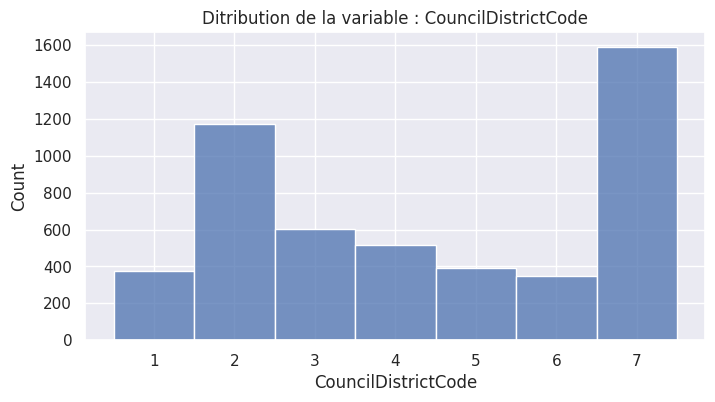

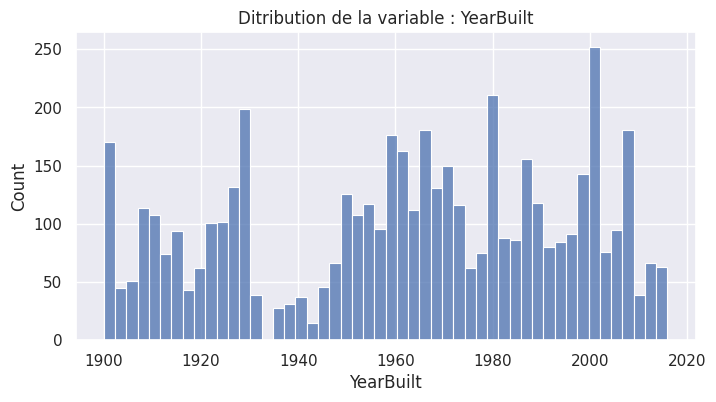

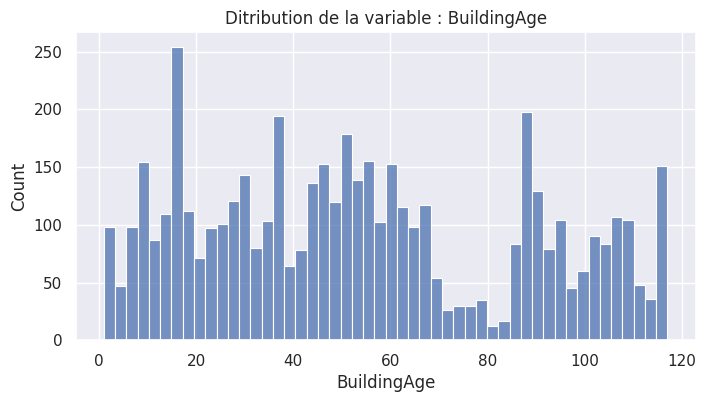

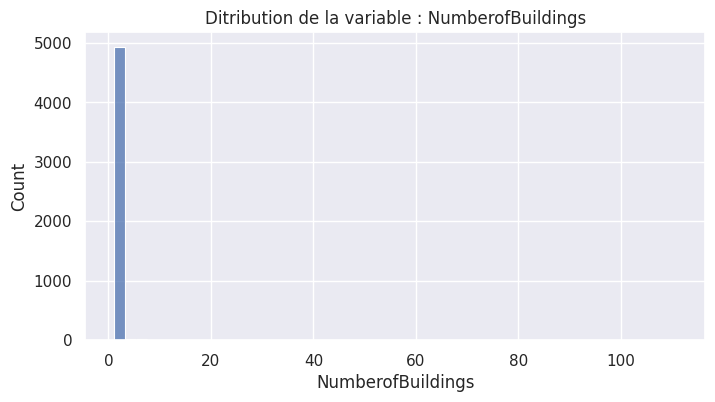

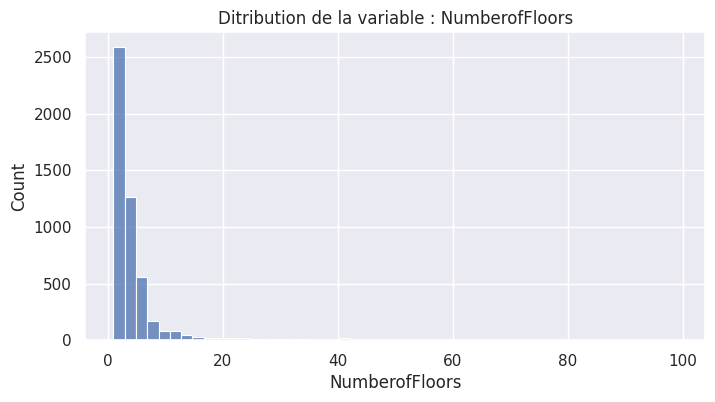

...

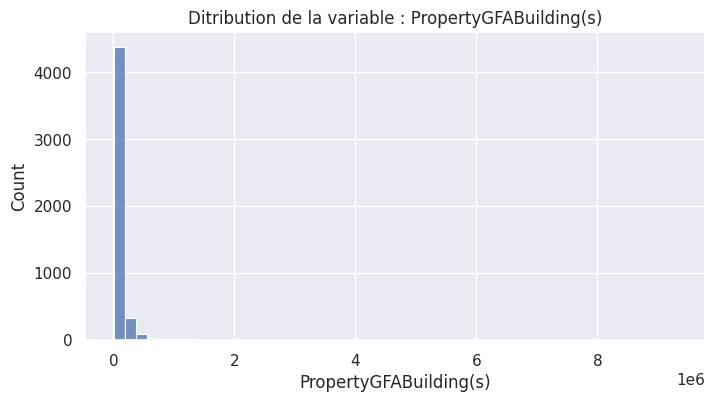

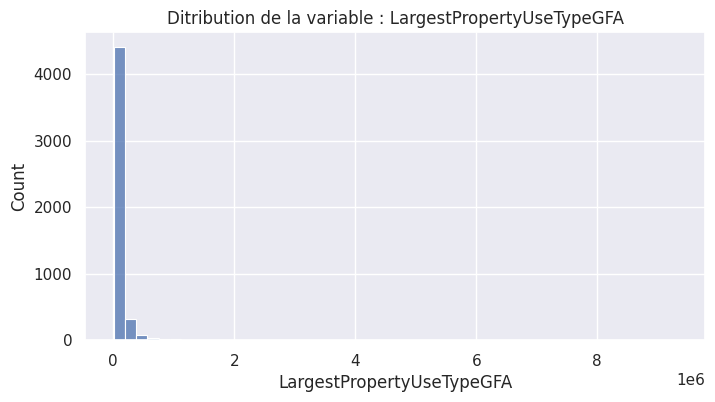

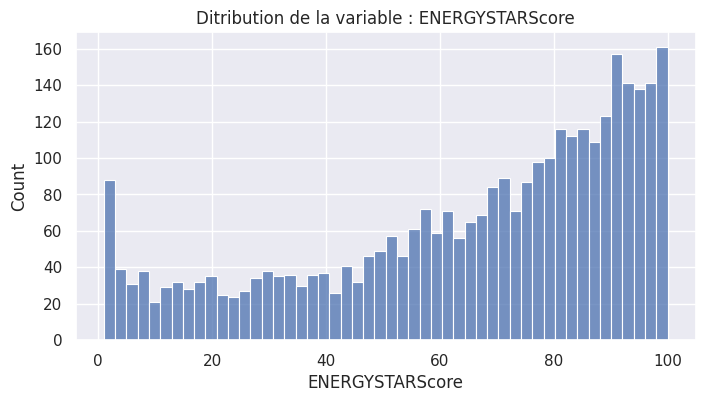

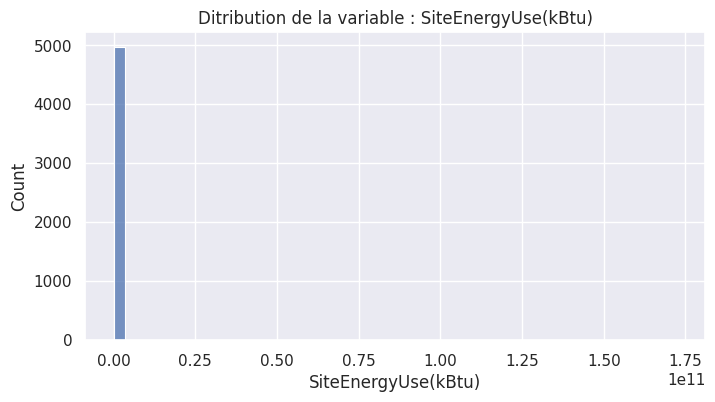

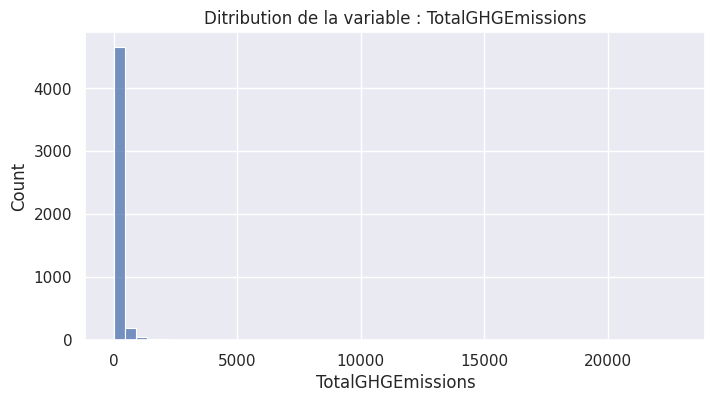

In [474]:
plt_columns = ['CouncilDistrictCode', 'YearBuilt', 'BuildingAge', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
               'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 
               'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
for col in plt_columns:
    plt.figure(figsize=(8,4))
    titre = 'Ditribution de la variable : ' + col 
    plt.title(titre)
    sns.histplot(df[col], bins = 50)


Nous remarquons des différences d'ordre de grandeurs notamment entre SiteEnergyUse(KBtu) et TotalGHGEmissions avec le reste des variables.

Nous allons effectuer des transformations sur ces variables.

Traitons les valeurs atypiques avant les transformation:
 - en utilisant la colonne Outlier
 - Méthode des quantiles

#### Outlier

In [475]:
df['Outlier'].value_counts()

Outlier
Low outlier     27
Low Outlier     17
High Outlier    14
High outlier     4
Name: count, dtype: int64

In [476]:
print("La taille du dataset avant suppression des outliers : ", df.shape)
df = df[df['Outlier'].isna()]
print("La taille du dataset après suppression des outliers : ", df.shape)

La taille du dataset avant suppression des outliers :  (5000, 21)
La taille du dataset après suppression des outliers :  (4938, 21)


In [477]:
df.drop(columns='Outlier', inplace=True)
df.shape

(4938, 20)

In [483]:
# Application du Log aux variables cibles
# En ignorant les valeurs inférieures à 1

def log_transform(value):
    if value >= 1:
        return np.log(value)
    else:
        return value

# Appliquer la fonction personnalisée à la colonne "SiteEnergyUse(kBtu)"
df['log_SiteEnergyUse(kBtu)'] = df['SiteEnergyUse(kBtu)'].apply(log_transform)

# Appliquer la fonction personnalisée à la colonne "TotalGHGEmissions"
df['log_TotalGHGEmissions'] = df['TotalGHGEmissions'].apply(log_transform)

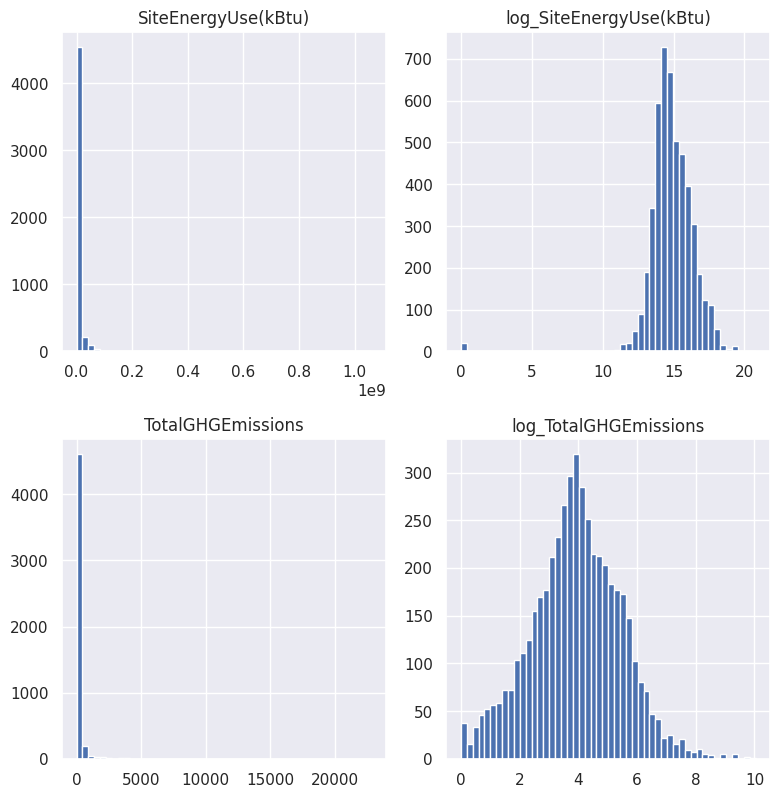

In [484]:
log_cols= ['SiteEnergyUse(kBtu)','log_SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'log_TotalGHGEmissions']
df[log_cols].hist(bins=50, figsize=(8, 16), layout=(4, 2)) 
plt.tight_layout()

#### Quantiles

In [485]:
def IQR_transform(data, variable):
    Q1 = data[variable].quantile(0.25)
    Q3 = data[variable].quantile(0.75)
    
    IQR = Q3 - Q1
    low = Q1 - 1.5 * IQR
    upp = Q3 + 1.5 * IQR
    
    data = data[(data[variable] >= low) & (data[variable] <= upp)]
    return data[variable]
    
df['IQR_log_SiteEnergyUse(kBtu)'] = IQR_transform(df, 'log_SiteEnergyUse(kBtu)')
df['IQR_log_TotalGHGEmissions'] = IQR_transform(df, 'log_TotalGHGEmissions')


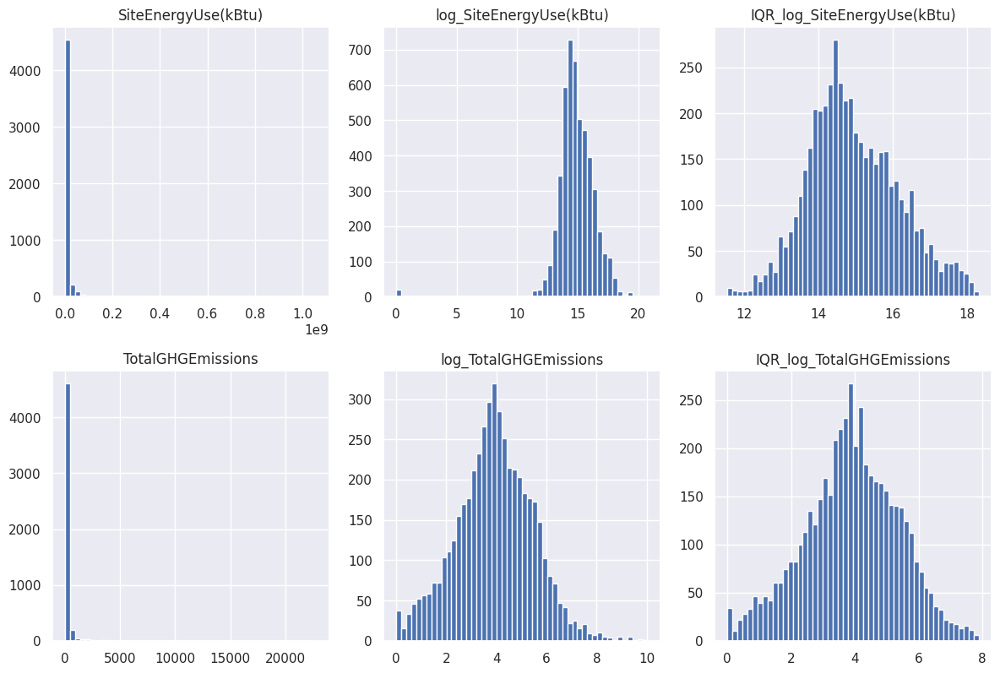

In [486]:
IQR_log_cols= ['SiteEnergyUse(kBtu)','log_SiteEnergyUse(kBtu)','IQR_log_SiteEnergyUse(kBtu)',
           'TotalGHGEmissions', 'log_TotalGHGEmissions', 'IQR_log_TotalGHGEmissions']
df[IQR_log_cols].hist(bins=50, figsize=(12, 16), layout=(4, 3)) 
plt.tight_layout()

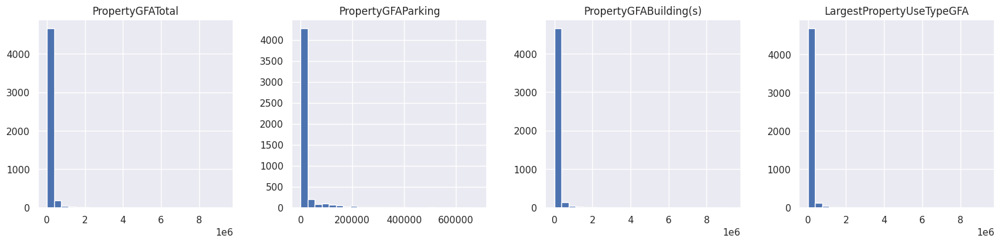

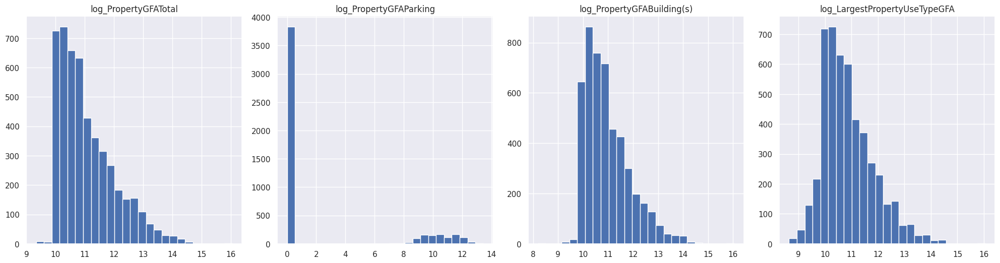

In [495]:
property_cols = ['PropertyGFATotal','PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA']
log_property_cols = ['log_PropertyGFATotal','log_PropertyGFAParking', 'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA']

for i, j in zip(log_property_cols, property_cols):
    df[i] = df[j].apply(log_transform)

df[property_cols].hist(bins=25, figsize=(20, 40), layout=(8, 4)) 

df[log_property_cols].hist(bins=25, figsize=(20, 40), layout=(8, 4)) 
plt.tight_layout()

#### Coordonnées : Latitude & Longitude

In [506]:
df_nan = df.loc[(df['Latitude'].isna()) & (df['Longitude'].isna()) ]
print("le nombres d'observations dont Latitude est Longitude sont manquantes:", df_nan.shape[0])
print("la proportion de ces observations :", df_nan.shape[0]/df.shape[0]*100)

le nombres d'observations dont Latitude est Longitude sont manquantes: 8
la proportion de ces observations : 0.16200891049007696


In [508]:
# Suppression de ces observations
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

Vérifons que toutes les coordonées correspond à la ville de Seattle

!pip install geopy

In [511]:
from geopy.distance import great_circle

# Coordonnées de latitude et de longitude de Seattle
seattle_coordinates = (47.608013, -122.335167)  # Latitude, Longitude

# Distance maximale acceptable pour considérer que les coordonnées sont à Seattle
max_distance_km = 20  # Par exemple, 20 kilomètres

# Fonction pour vérifier si les coordonnées sont à Seattle
def is_in_seattle(row):
    coordinates = (row['Latitude'], row['Longitude'])
    distance = great_circle(seattle_coordinates, coordinates).kilometers
    return distance <= max_distance_km

# Appliquez la fonction aux observations de votre DataFrame
df['InSeattle'] = df.apply(is_in_seattle, axis=1)
df['InSeattle'].value_counts()

InSeattle
True    4930
Name: count, dtype: int64

In [517]:
df.drop(columns='InSeattle', inplace=True)

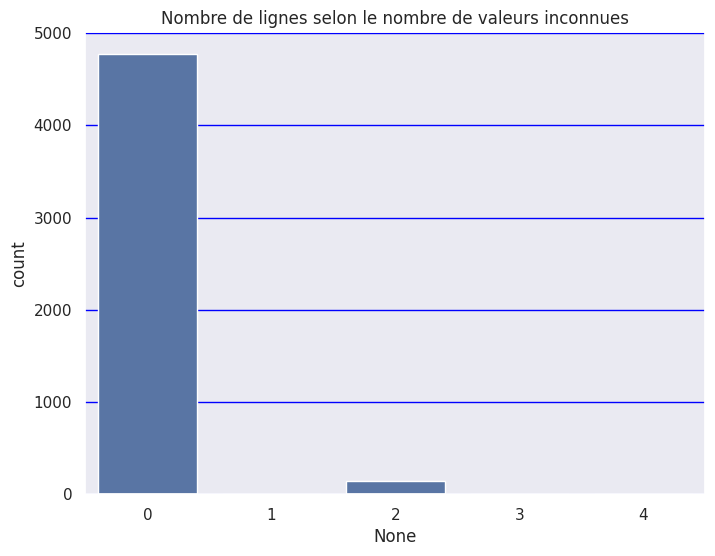

In [519]:
cols_check = ['PrimaryPropertyType', 'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude','YearBuilt', 
              'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
              'SiteEnergyUse(kBtu)','TotalGHGEmissions'] 
# Visualisation du nombre de nan par ligne
df_chek = df[cols_check]
plt.figure(figsize=(8, 6))
sns.set()
ax = sns.barplot(y = df_chek.isnull().sum(axis=1).value_counts(), x=df_chek.isnull().sum(axis=1).value_counts().index)
plt.title('Nombre de lignes selon le nombre de valeurs inconnues')
plt.grid(axis='y', color='blue')
plt.show()

In [522]:
df.isna().sum()

OSEBuildingID                       0
DataYear                            0
BuildingType                        0
PrimaryPropertyType                 3
CouncilDistrictCode                 0
Neighborhood                        0
Latitude                            0
Longitude                           0
YearBuilt                           1
NumberofBuildings                   0
NumberofFloors                      0
PropertyGFATotal                    0
PropertyGFAParking                 67
PropertyGFABuilding(s)             67
LargestPropertyUseType             81
LargestPropertyUseTypeGFA          81
ENERGYSTARScore                  1687
SiteEnergyUse(kBtu)                22
TotalGHGEmissions                   7
BuildingAge                         1
log_SiteEnergyUse(kBtu)            22
log_TotalGHGEmissions               7
IQR_log_SiteEnergyUse(kBtu)        98
IQR_log_TotalGHGEmissions          44
log_PropertyGFATotal                0
log_PropertyGFAParking             67
log_Property

In [525]:
# Suppressions des observation dont primarypropertyTpe est manquante
df_nan = df.loc[df['PrimaryPropertyType'].isna()]
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

In [528]:
# Suppressions des observation dont SiteEnergyUse est manquante
df_nan = df.loc[df['SiteEnergyUse(kBtu)'].isna()]
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

In [530]:
# Suppressions des observation dont YearBuilt est manquante
df_nan = df.loc[df['YearBuilt'].isna()]
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

In [535]:
# Suppressions des observation dont PropertyGFABuilding(s) est manquante
df_nan = df.loc[df['PropertyGFABuilding(s)'].isna()]
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

In [539]:
# Suppressions des observation dont LargestPropertyUseType est manquante
df_nan = df.loc[df['LargestPropertyUseType'].isna()]
df.drop(labels = df_nan.index, inplace = True)
df = df.reset_index(drop=True)

In [540]:
df.isna().sum()

OSEBuildingID                       0
DataYear                            0
BuildingType                        0
PrimaryPropertyType                 0
CouncilDistrictCode                 0
Neighborhood                        0
Latitude                            0
Longitude                           0
YearBuilt                           0
NumberofBuildings                   0
NumberofFloors                      0
PropertyGFATotal                    0
PropertyGFAParking                  0
PropertyGFABuilding(s)              0
LargestPropertyUseType              0
LargestPropertyUseTypeGFA           0
ENERGYSTARScore                  1622
SiteEnergyUse(kBtu)                 0
TotalGHGEmissions                   0
BuildingAge                         0
log_SiteEnergyUse(kBtu)             0
log_TotalGHGEmissions               0
IQR_log_SiteEnergyUse(kBtu)        73
IQR_log_TotalGHGEmissions          35
log_PropertyGFATotal                0
log_PropertyGFAParking              0
log_Property

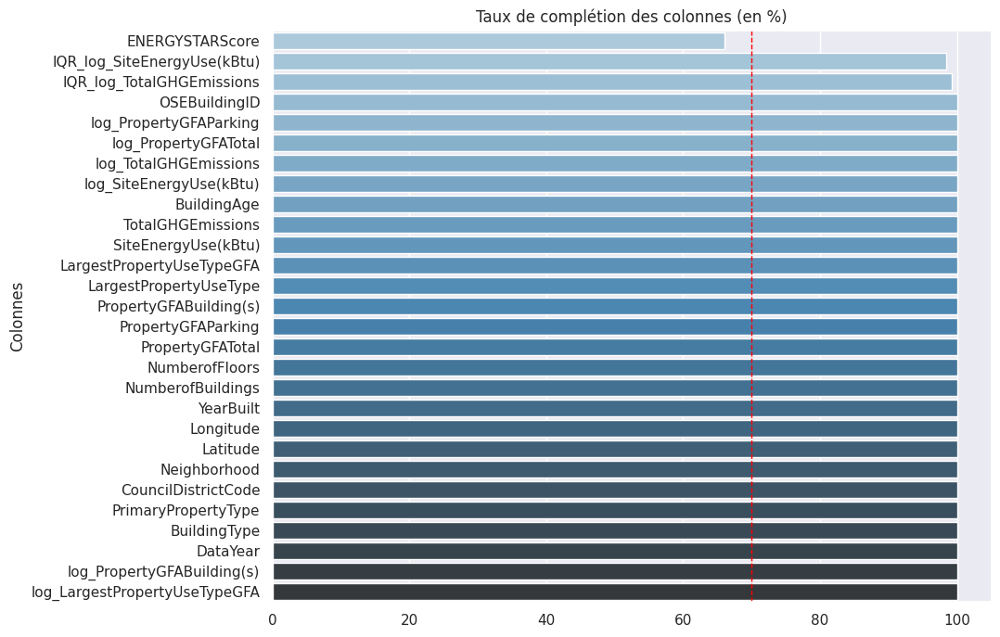

In [544]:
# Revisualisation du taux de complétion des colonnes

warnings.filterwarnings("ignore")
completion = (df.count().divide(df.shape[0])*100).sort_values()
plt.figure(figsize=(10, 8))
ax = sns.barplot(y = completion.index, x=completion.values, palette="Blues_d")
plt.title('Taux de complétion des colonnes (en %)')
plt.ylabel('Colonnes')
ax.axvline(x=70, color='red', linestyle='--', linewidth=1)
plt.show()

#### Doublons

In [555]:
print("Le nombre de doublons :",df.duplicated().sum())

Le nombre de doublons : 0


# II. Analyse des données :

In [557]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'BuildingAge', 'log_SiteEnergyUse(kBtu)', 'log_TotalGHGEmissions',
       'IQR_log_SiteEnergyUse(kBtu)', 'IQR_log_TotalGHGEmissions',
       'log_PropertyGFATotal', 'log_PropertyGFAParking',
       'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA'],
      dtype='object')

In [582]:
df['BuildingType'] = df['BuildingType'].cat.remove_categories('Multifamily')
df['BuildingType'].unique()

['NonResidential', 'SPS-District K-12', 'Campus', 'Nonresidential COS', 'Nonresidential WA']
Categories (5, object): ['Campus', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']

Visualisons les catégories de bâtiments et leurs proportions

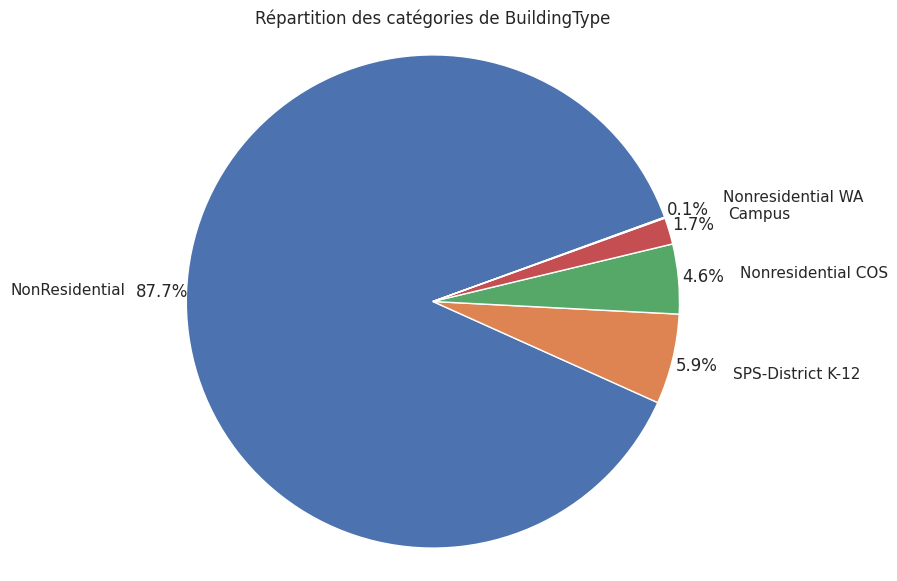

BuildingType
NonResidential        4185
SPS-District K-12      282
Nonresidential COS     218
Campus                  83
Nonresidential WA        3
Name: count, dtype: int64


In [630]:
plt.figure(figsize=(7, 7))
plt.pie(df['BuildingType'].value_counts(), 
        labels=df['BuildingType'].value_counts().index, autopct='%1.1f%%',pctdistance = 1.1, 
        labeldistance = 1.25, startangle=20, wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' },)
plt.axis('equal') 
plt.title('Répartition des catégories de BuildingType')
plt.show()
print(df.BuildingType.value_counts())

La catégorie 'Nonresidential WA' représente seulement 3 observations, pour facilier l'encodage de cette variable, nous allons supprimers ces observations

In [693]:
to_drop=df[df['BuildingType']=="Nonresidential WA"].index
df.drop(to_drop, inplace=True)

In [720]:
df['BuildingType'] = df['BuildingType'].cat.remove_categories('Nonresidential WA')


In [625]:
df['PrimaryPropertyType'] = df['PrimaryPropertyType'].cat.remove_categories('SPS-District K-12')


Visualisons la répartitions des catégories de PrimaryProperyUseType

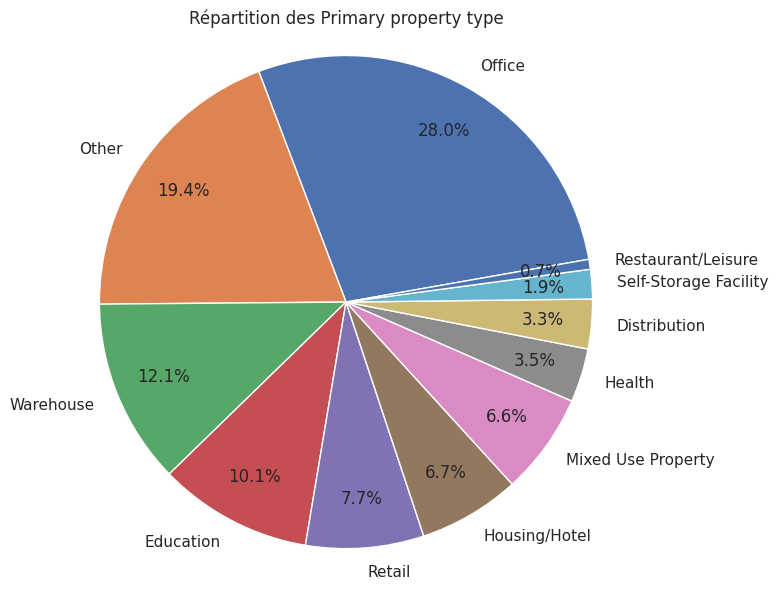

PrimaryPropertyType
Office                   1334
Other                     924
Warehouse                 579
Education                 481
Retail                    369
Housing/Hotel             318
Mixed Use Property        317
Health                    168
Distribution              155
Self-Storage Facility      92
Restaurant/Leisure         31
Name: count, dtype: int64


In [694]:
plt.figure(figsize=(7,7))
plt.pie(df['PrimaryPropertyType'].value_counts(), 
       labels=df['PrimaryPropertyType'].value_counts().index, autopct='%1.1f%%', pctdistance=0.8,
       startangle=10)
plt.axis('equal')
plt.title('Répartition des Primary property type')
plt.show()
print(df.PrimaryPropertyType.value_counts())

Dans l'étape nettoyage de cette variable, nous avons rassembler plusieurs sous catégories dans une catégorie principale. Par exemple les catégories "large office, small and mid-sized office, financial office,.." dans une catégorie "Office". celle-ci occupe près de 30% des utilisations des bâtiments.

Comparons les catégories des deux variables : PrimaryPropertyType et LargestPropertyUseType.

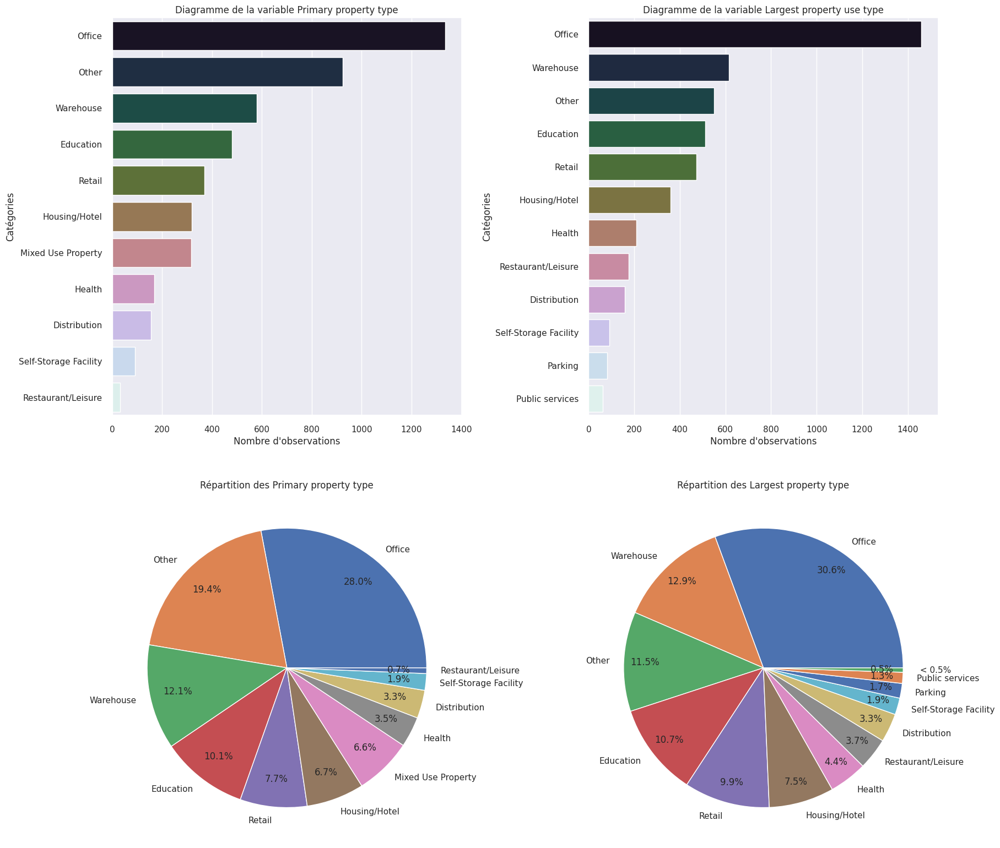

In [695]:
fig, axes = plt.subplots(2, 2, figsize=(18,16))

# Diagramme en barre

primary = df['PrimaryPropertyType'].value_counts()
sns.barplot(y = primary.index, x=primary.values, order=primary.index, palette="cubehelix", ax=axes[0, 0])
axes[0, 0].set_xlabel("Nombre de bâtiments")
axes[0, 0].set_ylabel("Catégories")
axes[0, 0].set_title('Diagramme de la variable Primary property type')


# Diagrammes circulaires 
axes[1, 0].pie(primary,
            labels= primary.index, 
            autopct='%1.1f%%', 
            startangle=0,
            pctdistance = 0.8)
           
axes[1, 0].set_title('Répartition des Primary property type')


# Diagramme en barre
largest = df['LargestPropertyUseType'].value_counts().head(12)
sns.barplot(y = largest.index, x=largest.values, order=largest.index, palette="cubehelix", ax=axes[0, 1])
axes[0, 1].set_xlabel("Nombre de bâtiments")
axes[0, 1].set_ylabel("Catégories")
axes[0, 1].set_title('Diagramme de la variable Largest property use type')


# Diagrammes circulaires

top_frequency = df.LargestPropertyUseType.value_counts()/df.LargestPropertyUseType.count()

top_categories = top_frequency.head(12).index.tolist()
autres = 1 - top_frequency.head(12).sum()

# liste de fréquences pour les cinq premières modalités et "Autres"
frequencies = top_frequency.head(12).tolist() + [autres]
categories = top_categories + [' < 0.5%']

# axes[1].pie(frequencies, labels=categories, autopct='%1.1f%%', startangle=90)

axes[1, 1].pie(frequencies, 
            labels= categories, 
            autopct='%1.1f%%', 
            startangle=0,
            pctdistance = 0.85)
           # wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
           # colors = custom_palette)
axes[1, 1].set_title('Répartition des Largest property type')

plt.tight_layout()

plt.show()

La catégorie "Office" occupe dans les deux cas près de 30% des observations. Mais la répartition ainsi que le nombre de catégorie n'est pas identique pour ces deux variables.

Passons à la variable Neighborhood :

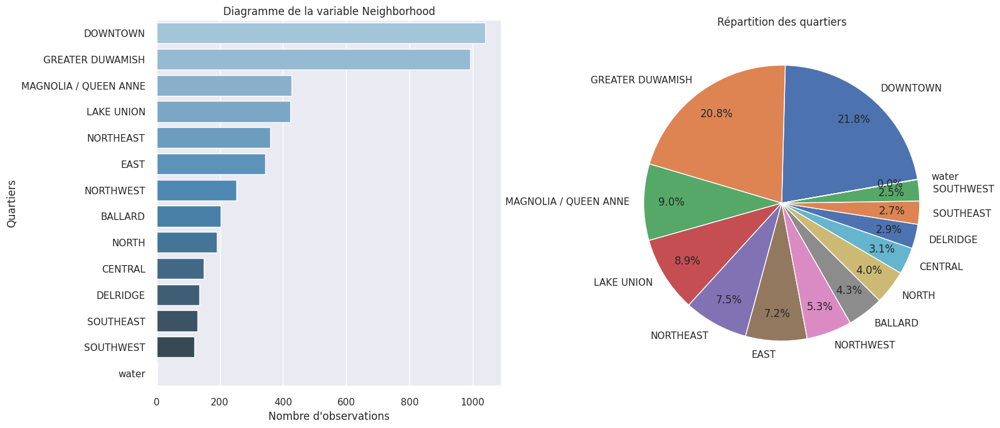

In [696]:
fig, axes = plt.subplots(1, 2, figsize=(16,7))

neighbor = df['Neighborhood'].value_counts()
sns.barplot(y = neighbor.index, x=neighbor.values, order=neighbor.index, palette="Blues_d", ax=axes[0])
axes[0].set_xlabel("Nombre de bâtiments")
axes[0].set_ylabel("Quartiers")
axes[0].set_title('Diagramme de la variable Neighborhood')


# Diagrammes circulaires 
axes[1].pie(neighbor,
            labels= neighbor.index, 
            autopct='%1.1f%%', 
            startangle=10,
            pctdistance = 0.8)
           # wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
           # colors = custom_palette)
axes[1].set_title('Répartition des quartiers')

plt.tight_layout()

plt.show()

In [681]:
df.loc[df['Neighborhood'] == 'water']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,TotalGHGEmissions,BuildingAge,log_SiteEnergyUse(kBtu),log_TotalGHGEmissions,IQR_log_SiteEnergyUse(kBtu),IQR_log_TotalGHGEmissions,log_PropertyGFATotal,log_PropertyGFAParking,log_PropertyGFABuilding(s),log_LargestPropertyUseTypeGFA
4479,25464,2017,NonResidential,Office,7.0,water,47.63575,-122.33895,1965.0,1.0,...,118.78,52.0,15.225835,4.777273,15.225835,4.777273,10.336568,0.0,10.336568,10.283806
4490,25563,2017,NonResidential,Warehouse,7.0,water,47.64306,-122.34219,1968.0,1.0,...,49.16,49.0,15.282348,3.895080,15.282348,3.895080,10.292078,0.0,10.292078,9.890858


La catégorie 'water' de la variable Neighborhood représente seulement 2 observations, nous allons supprimers ces observations

In [697]:
to_drop=df[df['Neighborhood']=="water"].index
df.drop(to_drop, inplace=True)

In [723]:
df['Neighborhood'] = df['Neighborhood'].cat.remove_categories('water')

### Analyse des variables numériques :

Nous avons créé une variable 'BuildingAge', commençons par visualiser sa distribution 


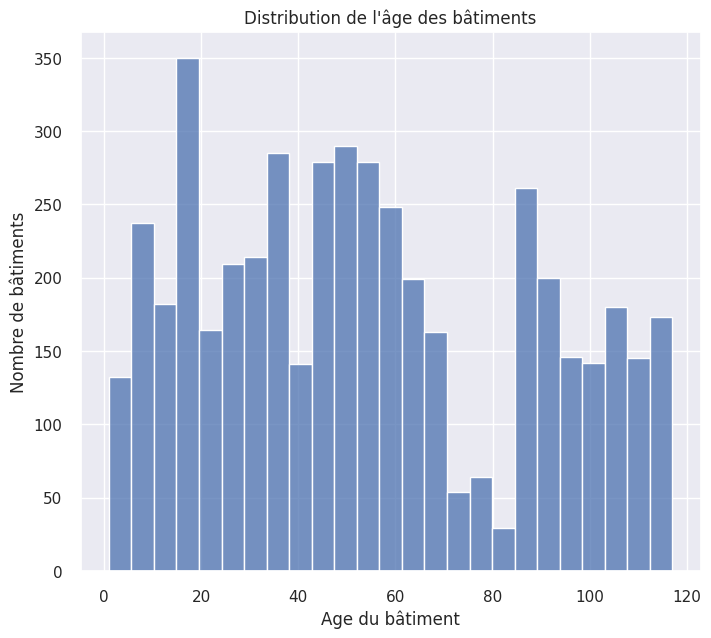

La variable BuildingAge 
 : count    4766.000000
mean       54.220520
std        32.661478
min         1.000000
25%        27.000000
50%        51.000000
75%        86.000000
max       117.000000
Name: BuildingAge, dtype: float64


In [703]:
fig = plt.figure(figsize=(8,7))
ax = sns.histplot(data=df, x='BuildingAge', bins=25)
ax.set_xlabel("Age du bâtiment")
ax.set_ylabel("Nombre de bâtiments")
plt.title("Distribution de l'âge des bâtiments",)
plt.show()
print("La variable BuildingAge \n :", df.BuildingAge.describe())

L'âge des batiments varie de 1 et 117 ans. Notons que certains âges sont plus représentés que d'autre.

Il serait interessant de visualiser la consommation totale de l'énergie et l'émission de CO2 en fonction de l'âge du bâtiment.

On peut émettre l'hypothèse : les anciens bâtiments consomment plus d'énergie et émettent plus de CO2. Vérifions cela :

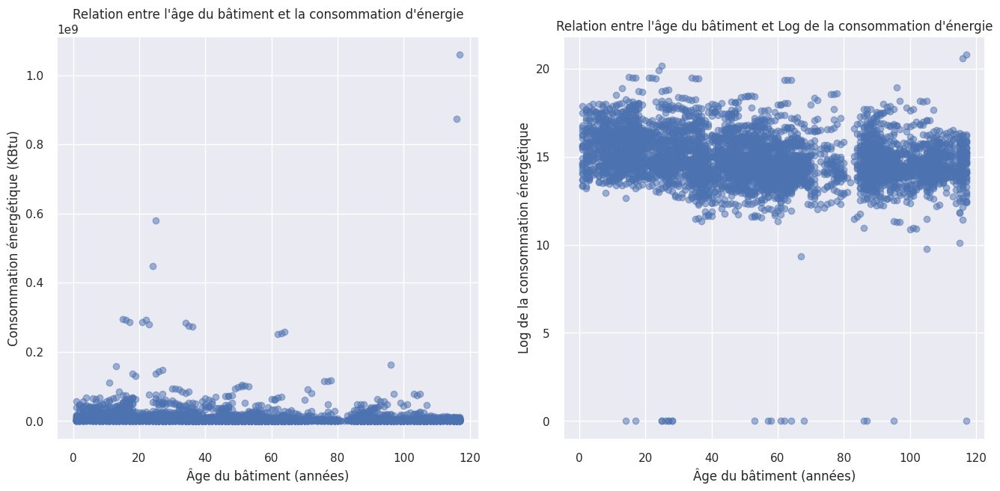

In [708]:
fig, axes = plt.subplots(1, 2, figsize=(16,7))
# plt.figure(figsize=(10, 6))
axes[0].scatter(df['BuildingAge'], df['SiteEnergyUse(kBtu)'], alpha=0.5)#, ax=axes[0])  
axes[0].set_title("Relation entre l'âge du bâtiment et la consommation d'énergie")
axes[0].set_xlabel('Âge du bâtiment (années)')
axes[0].set_ylabel('Consommation énergétique (KBtu)')
# plt.grid(True)

axes[1].scatter(df['BuildingAge'], df['log_SiteEnergyUse(kBtu)'], alpha=0.5)#, ax=axes[1])  
axes[1].set_title("Relation entre l'âge du bâtiment et Log de la consommation d'énergie")
axes[1].set_xlabel('Âge du bâtiment (années)')
axes[1].set_ylabel('Log de la consommation énergétique')
# plt.grid(True)
plt.show()

L'âge du bâtiment ne semble pas influencer directement la consommation de l'énergie.

qu'en est-il des émissions de CO2 ?

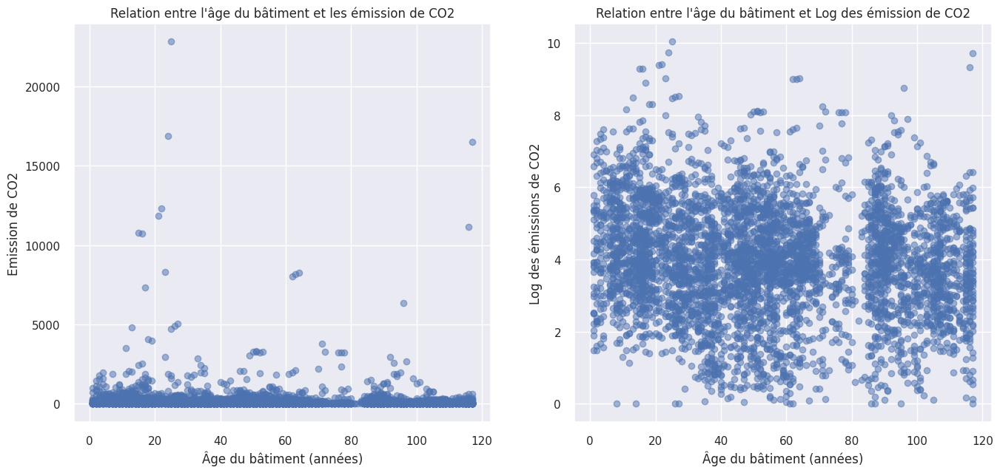

In [710]:
fig, axes = plt.subplots(1, 2, figsize=(16,7))
# plt.figure(figsize=(10, 6))
axes[0].scatter(df['BuildingAge'], df['TotalGHGEmissions'], alpha=0.5)#, ax=axes[0])  
axes[0].set_title("Relation entre l'âge du bâtiment et les émission de CO2")
axes[0].set_xlabel('Âge du bâtiment (années)')
axes[0].set_ylabel('Emission de CO2')
# plt.grid(True)

axes[1].scatter(df['BuildingAge'], df['log_TotalGHGEmissions'], alpha=0.5)#, ax=axes[1])  
axes[1].set_title("Relation entre l'âge du bâtiment et Log des émission de CO2")
axes[1].set_xlabel('Âge du bâtiment (années)')
axes[1].set_ylabel('Log des émissions de CO2')
# plt.grid(True)
plt.show()

Même constat que précédemment : 
Il ne semble pas y avoir de relation linéaire entre l'âge du bâtiment et la quantité de CO2 émise

#### La consommation de l'énergie par : 
 - Type de bâtiment
 - District
 - Quartier

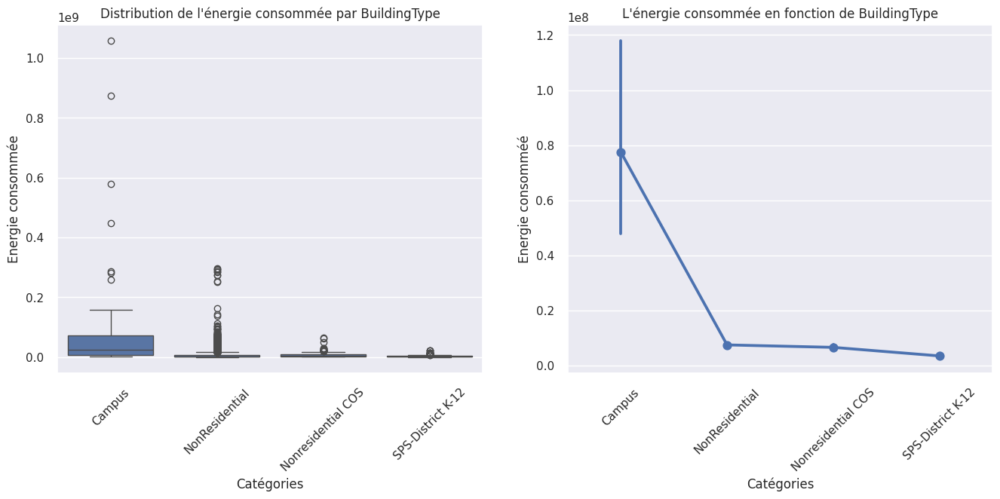

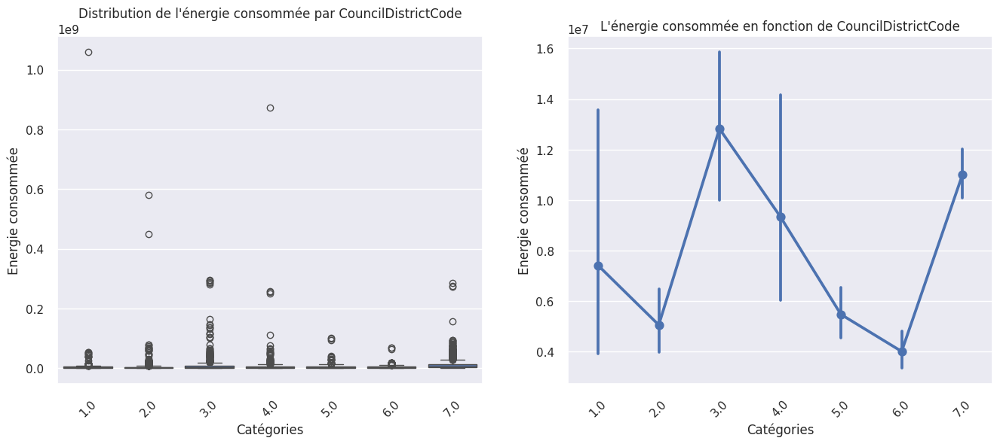

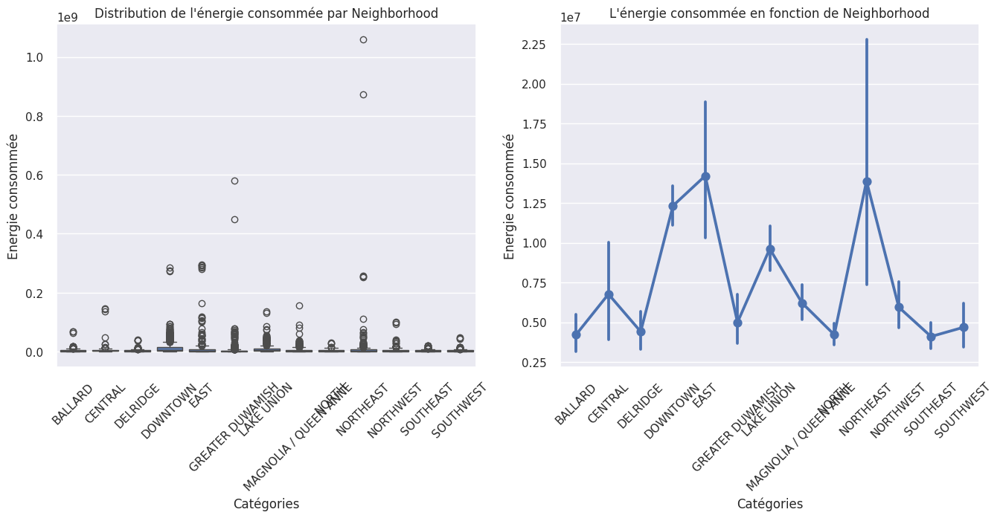

In [741]:
warnings.filterwarnings("ignore")

plt_cols=['BuildingType', 'CouncilDistrictCode', 'Neighborhood']

for col in plt_cols:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df, x=col, y="SiteEnergyUse(kBtu)", ax=ax[0])
    titre_1 = "Distribution de l'énergie consommée par " + col 
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Catégories")
    ax[0].set_ylabel("Energie consommée")
    ax[0].tick_params(axis='x', rotation=45)

    
    sns.pointplot(data = df, x = col, y ="SiteEnergyUse(kBtu)", ax=ax[1])
    titre_2 = "L'énergie consommée en fonction de " + col 
    ax[1].set_title(titre_2)
    ax[1].set_xlabel("Catégories")
    ax[1].set_ylabel("Energie consommée")
    ax[1].tick_params(axis='x', rotation=45)

    plt.show()

Quelques remarques sur la consommation énergitiques :
   - Plus importante dans les bâtiments de type "Campus"
   - Variable en fonction du district et du quartier

#### Les émissions de CO2 par : 
 - Type de bâtiment
 - District
 - Quartier

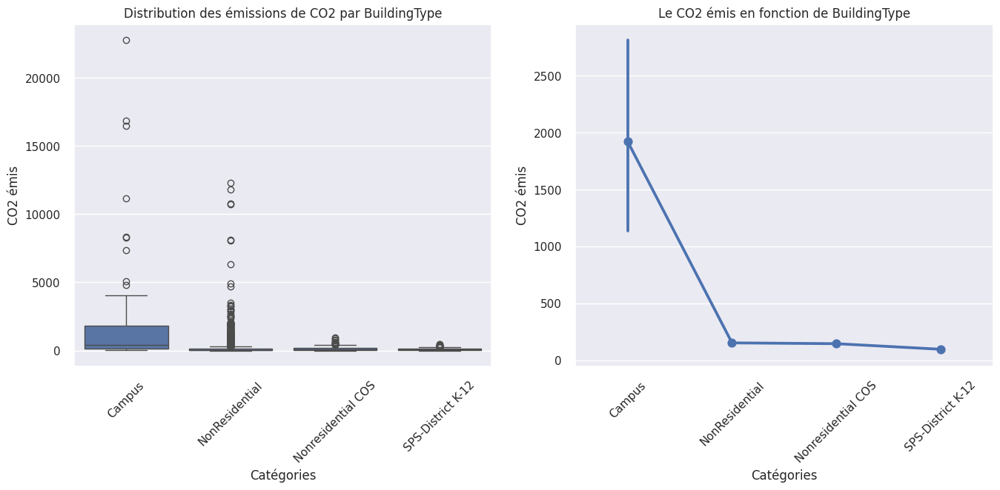

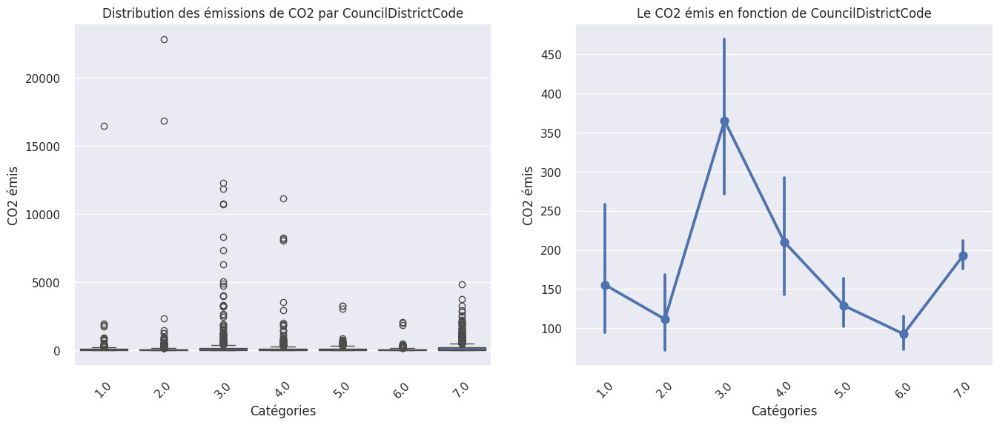

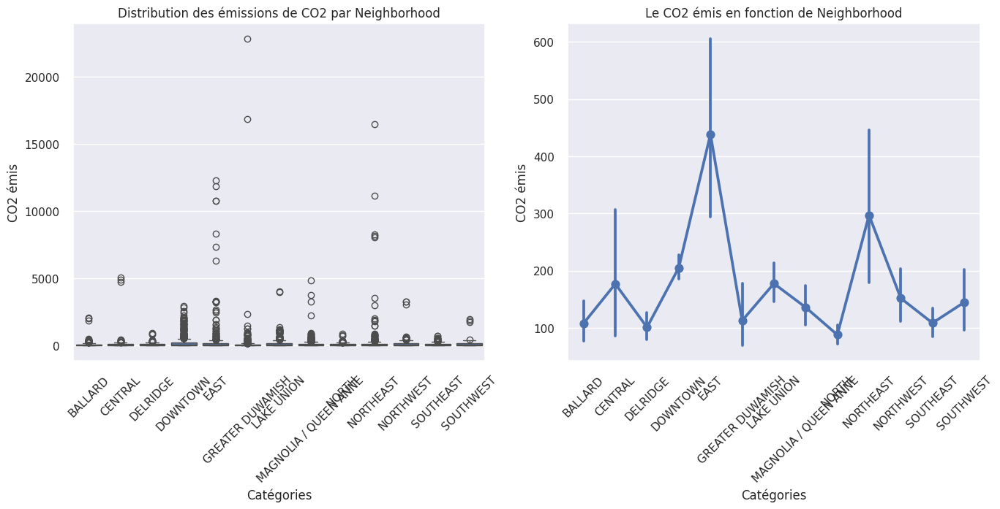

In [760]:
warnings.filterwarnings("ignore")

plt_cols=['BuildingType', 'CouncilDistrictCode', 'Neighborhood']

for col in plt_cols:
    fig, ax = plt.subplots(1, 2, figsize=(16,6))
    sns.boxplot(data=df, x=col, y="TotalGHGEmissions", ax=ax[0])
    titre_1 = "Distribution des émissions de CO2 par " + col 
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Catégories")
    ax[0].set_ylabel("CO2 émis")
    ax[0].tick_params(axis='x', rotation=45)

    
    sns.pointplot(data = df, x = col, y ="TotalGHGEmissions", ax=ax[1])
    titre_2 = "Le CO2 émis en fonction de " + col 
    ax[1].set_title(titre_2)
    ax[1].set_xlabel("Catégories")
    ax[1].set_ylabel("CO2 émis")
    ax[1].tick_params(axis='x', rotation=45)

    plt.show()

Remarques : les émissions de CO2 sont
   - Plus importante dans les bâtiments de type "Campus", comme la consommation d'énergie.
   - Varie en fonction du district et du quartier, plus importante dans le district 3 et quartier Est.

#### La consommation d'énergie par :
  - Utilisation principale du bâtiment
  - La plus grande utilisation du bâtiment

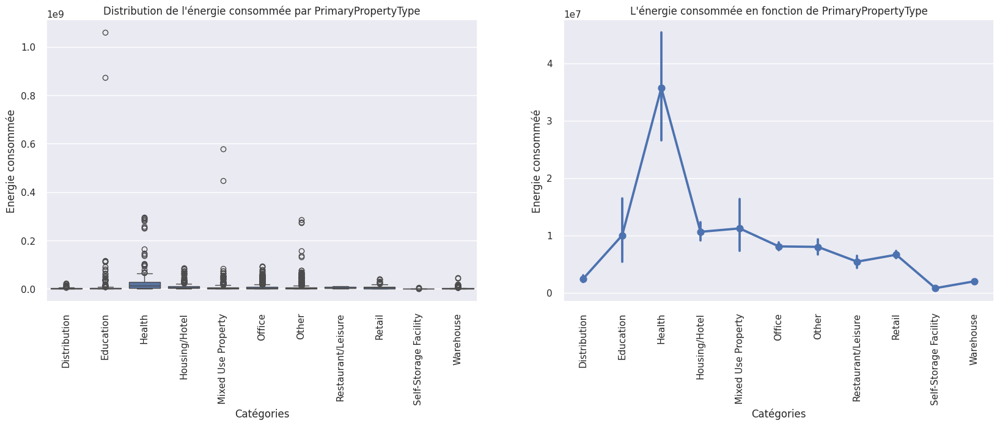

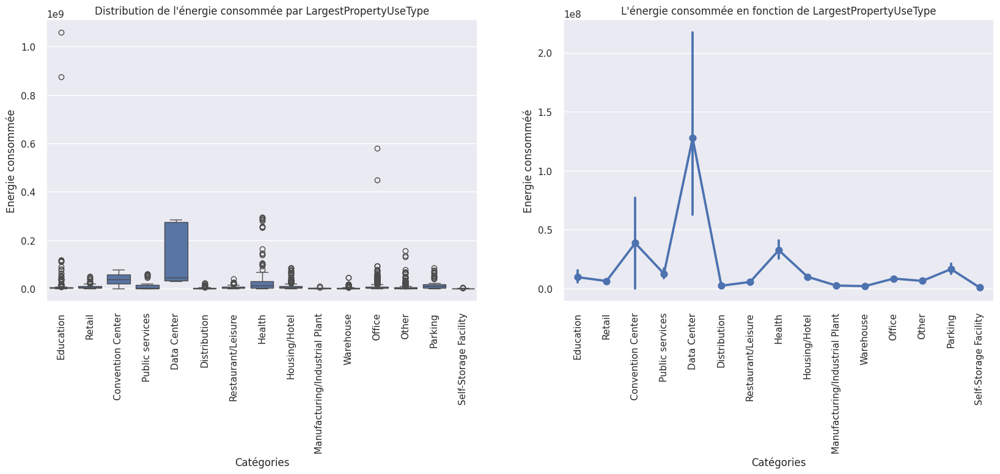

In [736]:
warnings.filterwarnings("ignore")

plt_cols=['PrimaryPropertyType', 'LargestPropertyUseType']

for col in plt_cols:
    fig, ax = plt.subplots(1, 2, figsize=(20,6))
    sns.boxplot(data=df, x=col, y="SiteEnergyUse(kBtu)", ax=ax[0])
    titre_1 = "Distribution de l'énergie consommée par " + col 
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Catégories")
    ax[0].set_ylabel("Energie consommée")
    ax[0].tick_params(axis='x', rotation=90)

    
    sns.pointplot(data = df, x = col, y ="SiteEnergyUse(kBtu)", ax=ax[1])
    titre_2 = "L'énergie consommée en fonction de " + col 
    ax[1].set_title(titre_2)
    ax[1].set_xlabel("Catégories")
    ax[1].set_ylabel("Energie consommée")
    ax[1].tick_params(axis='x', rotation=90)

    plt.show()

 - Les bâtiment dont l'utilisation pricipale est la santé (variable "PrimaryPropertyType") consomme plus d'énergie que les autres de la même variable. - Les bâtiment dont l'utilisation pricipale est la santé (variable "PrimaryPropertyType") consomme plus d'énergie que les autres de la même variable.
 - Les bâtiments dont la plus grande utilisation est data center (variable "LargestPropertyUseType") consomme le plus d'énergie que tout le reste des utilisation (dont la santé).
 - Les bâtiments dont la plus grande utilisation est data center (variable "LargestPropertyUseType") consomme le plus d'énergie que tout le reste des utilisation (dont la santé).

#### Les émissions de CO2 par :
  - Utilisation principale du bâtiment
  - La plus grande utilisation du bâtiment

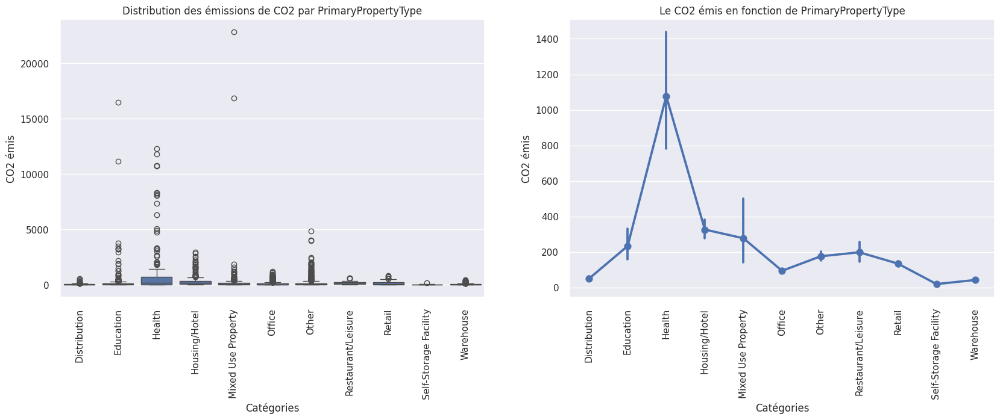

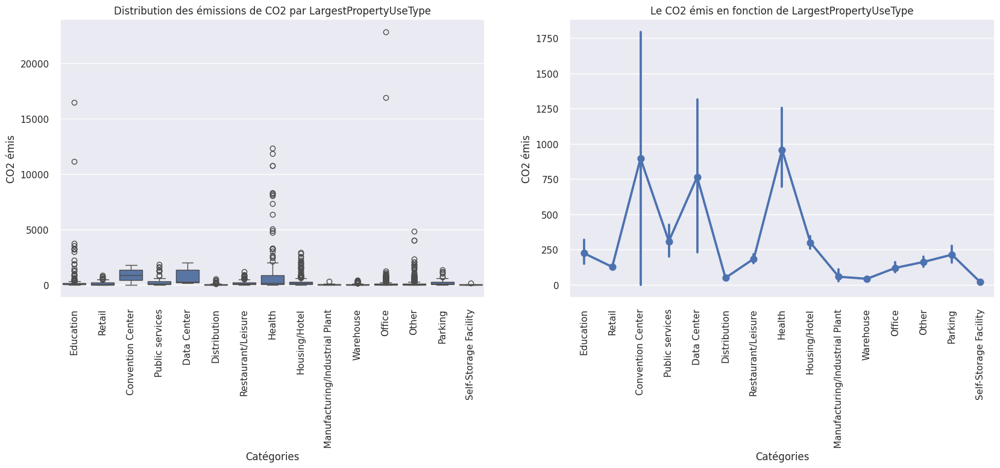

In [761]:
warnings.filterwarnings("ignore")

plt_cols=['PrimaryPropertyType', 'LargestPropertyUseType']

for col in plt_cols:
    fig, ax = plt.subplots(1, 2, figsize=(20,6))
    sns.boxplot(data=df, x=col, y="TotalGHGEmissions", ax=ax[0])
    titre_1 = "Distribution des émissions de CO2 par " + col 
    ax[0].set_title(titre_1)
    ax[0].set_xlabel("Catégories")
    ax[0].set_ylabel("CO2 émis")
    ax[0].tick_params(axis='x', rotation=90)

    
    sns.pointplot(data = df, x = col, y ="TotalGHGEmissions", ax=ax[1])
    titre_2 = "Le CO2 émis en fonction de " + col 
    ax[1].set_title(titre_2)
    ax[1].set_xlabel("Catégories")
    ax[1].set_ylabel("CO2 émis")
    ax[1].tick_params(axis='x', rotation=90)

    plt.show()

Constat similaire la consommation énergitiques :
 - Les bâtiment dont l'utilisation pricipale est la santé émettent plus de CO2 que les autres de la même variable.
 - Les bâtiments dont la plus grande utilisation est convention center, data center ou encore la santé émettent le plus de CO2 que tout le reste.

#### la consommation d'énergie par : 
    - Nombre d'immeubles
    - Nombre d'étages

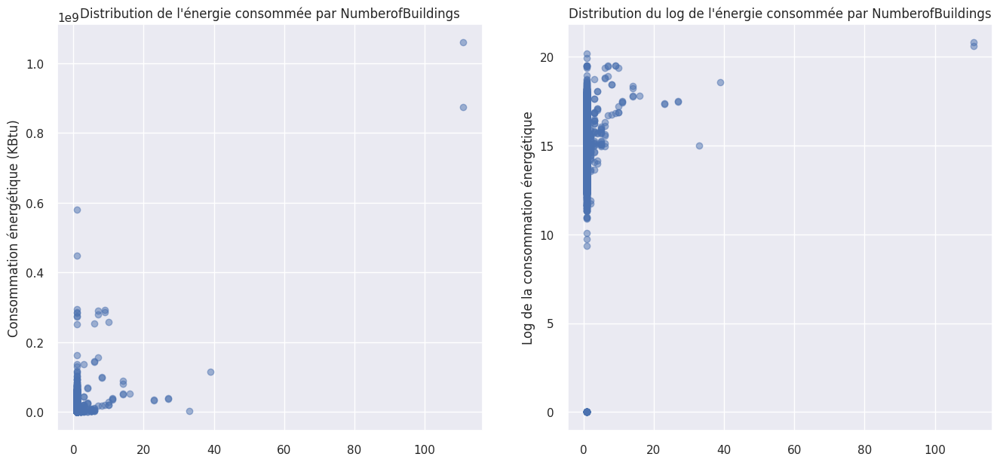

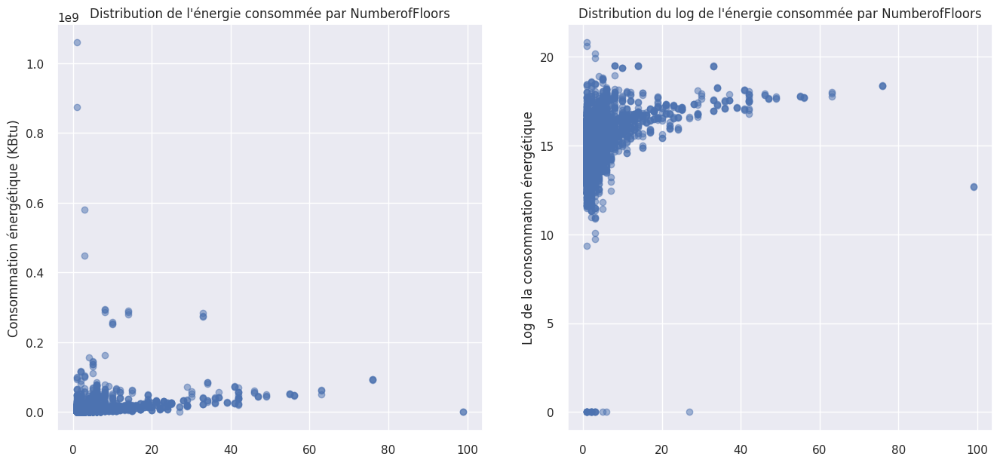

In [744]:
number_cols = ["NumberofBuildings", "NumberofFloors"]

for col in number_cols:
    fig, axes = plt.subplots(1, 2, figsize=(16,7))
    
    axes[0].scatter(df[col], df['SiteEnergyUse(kBtu)'], alpha=0.5)#, ax=axes[0])  
    titre_1 = "Distribution de l'énergie consommée par " + col 
    axes[0].set_title(titre_1)
    # x_lab = "Nombre"
    # axes[0].set_xlabel('Nombre')
    axes[0].set_ylabel('Consommation énergétique (KBtu)')
    
    
    axes[1].scatter(df[col], df['log_SiteEnergyUse(kBtu)'], alpha=0.5)#, ax=axes[1])  
    titre_2 = "Distribution du log de l'énergie consommée par " + col 
    axes[1].set_title(titre_2)
    # axes[1].set_xlabel('Âge du bâtiment (années)')
    axes[1].set_ylabel('Log de la consommation énergétique')
   
    plt.show()

#### les émissions de CO2 par : 
    - Nombre d'immeubles
    - Nombre d'étages

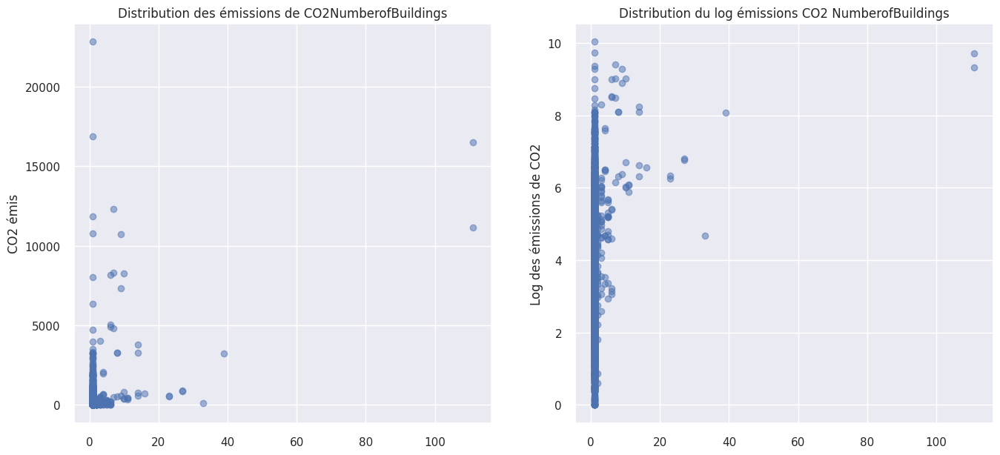

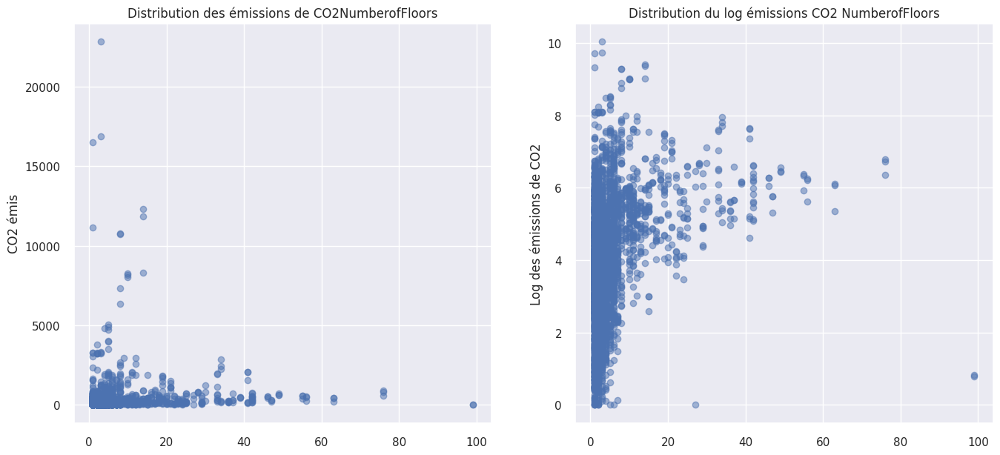

In [762]:
number_cols = ["NumberofBuildings", "NumberofFloors"]

for col in number_cols:
    fig, axes = plt.subplots(1, 2, figsize=(16,7))
    
    axes[0].scatter(df[col], df['TotalGHGEmissions'], alpha=0.5)#, ax=axes[0])  
    titre_1 = "Distribution des émissions de CO2" + col 
    axes[0].set_title(titre_1)
    
    axes[0].set_ylabel('CO2 émis')
    
    
    axes[1].scatter(df[col], df['log_TotalGHGEmissions'], alpha=0.5)#, ax=axes[1])  
    titre_2 = "Distribution du log émissions CO2 " + col 
    axes[1].set_title(titre_2)
   
    axes[1].set_ylabel('Log des émissions de CO2')
   
    plt.show()

#### la consommation d'énergie par : 
    - Surface totale, 
    - Surface de parking, 
    - Surface d'immeuble, 
    - La plus grande surface utilisée
Notre but sera de réduire le nombre de ces variables pour les prédiction de l'énergie et la consommation de CO2.

----------------------------------------------------------------------------------------------------------------


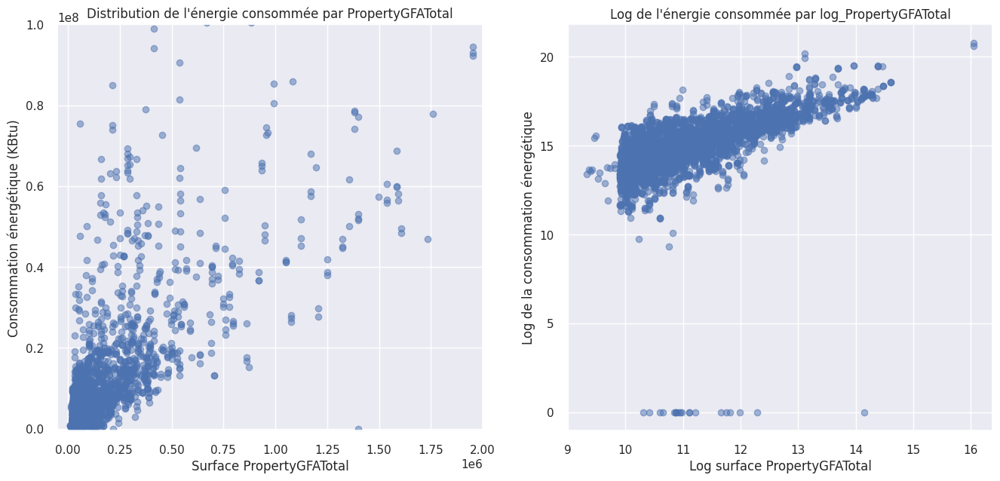

----------------------------------------------------------------------------------------------------------------


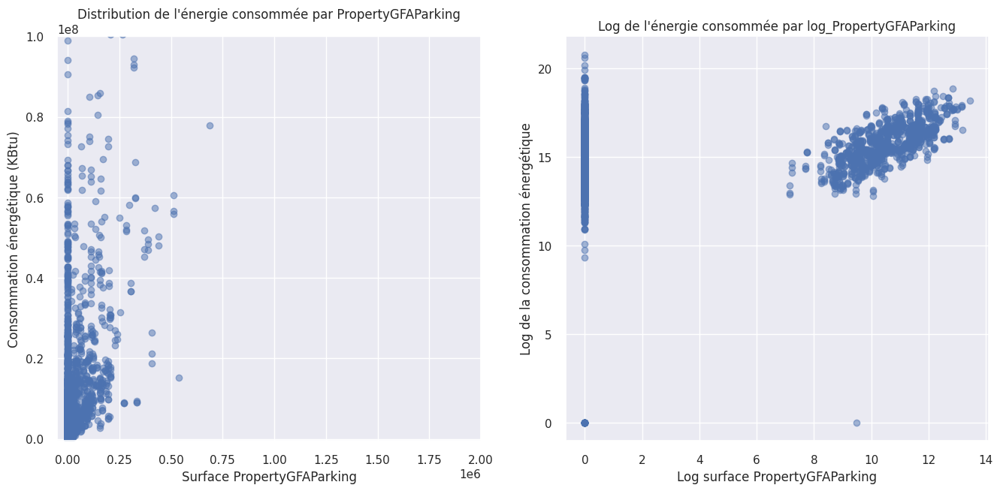

----------------------------------------------------------------------------------------------------------------


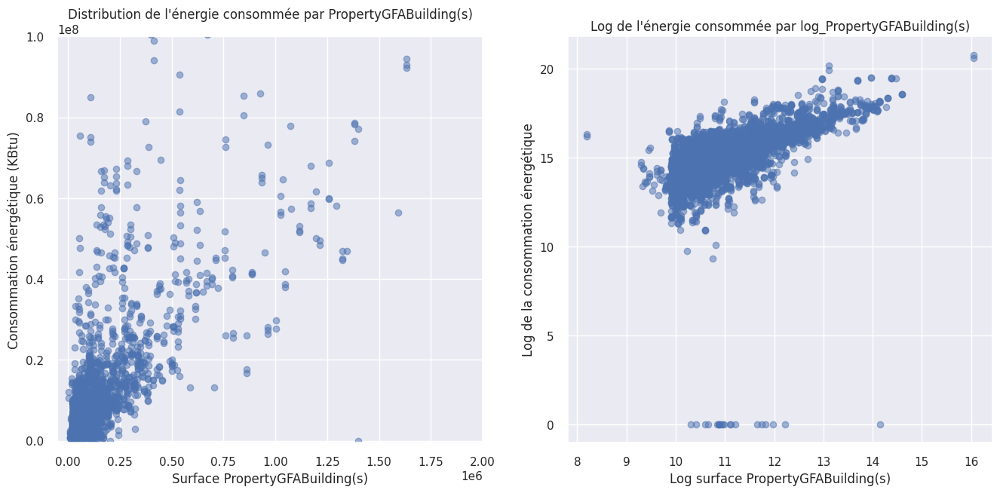

----------------------------------------------------------------------------------------------------------------


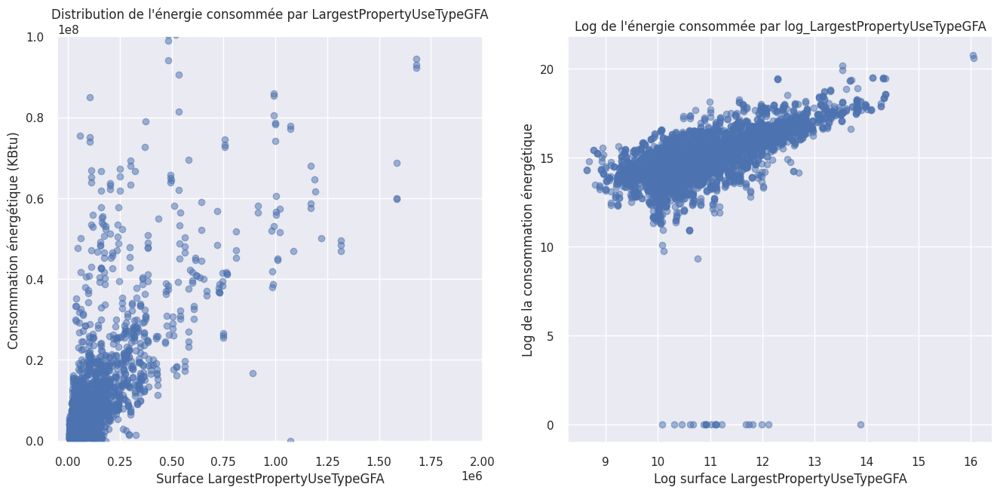

In [766]:
property_cols = ['PropertyGFATotal','PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA']
log_property_cols = ['log_PropertyGFATotal','log_PropertyGFAParking', 'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA']

for col, log_col in zip(property_cols, log_property_cols):

    fig, axes = plt.subplots(1, 2, figsize=(16,7))
    
    axes[0].scatter(df[col], df['SiteEnergyUse(kBtu)'], alpha=0.5) 
    titre_1 = "Distribution de l'énergie consommée par " + col 
    axes[0].set_title(titre_1)
    x_lab_1 = "Surface " + col
    axes[0].set_xlabel(x_lab_1)
    axes[0].set_ylabel('Consommation énergétique (KBtu)')
    axes[0].set_xlim(-50000, 2e6)
    axes[0].set_ylim(-500000, 1e8)
    
    axes[1].scatter(df[log_col], df['log_SiteEnergyUse(kBtu)'], alpha=0.5) 
    titre_2 = "Log de l'énergie consommée par " + log_col 
    axes[1].set_title(titre_2)
    x_lab_2 = "Log surface " + col
    axes[1].set_xlabel(x_lab_2)
    axes[1].set_ylabel('Log de la consommation énergétique')
    # axes[1].set_xlim(-50000, 2e6)
    print("----------------------------------------------------------------------------------------------------------------")
    plt.show()

Nous remarquons que les variables de surface ont un impact direct sur la consommation totale d'énergie.
Cependant ces variables ne sont pas toutes indispensables, pour éviter la redondance d'information, nous allons sélectionner la ou les variables pertinentes pour prédire l'énergie.

#### les émissions de CO2 par : 
    - Surface totale, 
    - Surface de parking, 
    - Surface d'immeuble, 
    - La plus grande surface utilisée


----------------------------------------------------------------------------------------------------------------


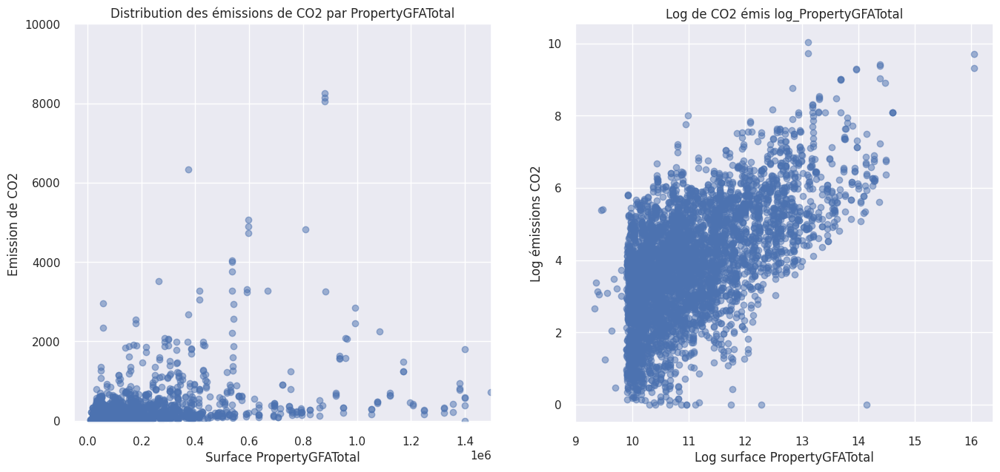

----------------------------------------------------------------------------------------------------------------


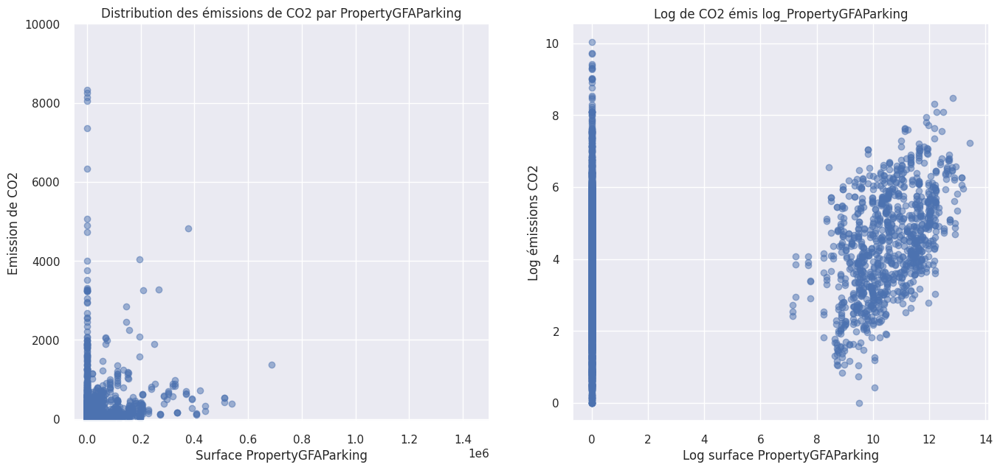

----------------------------------------------------------------------------------------------------------------


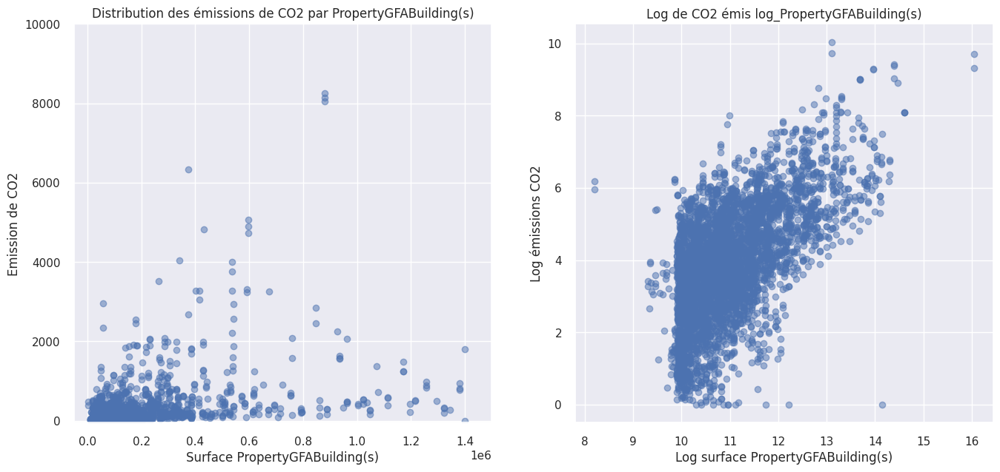

----------------------------------------------------------------------------------------------------------------


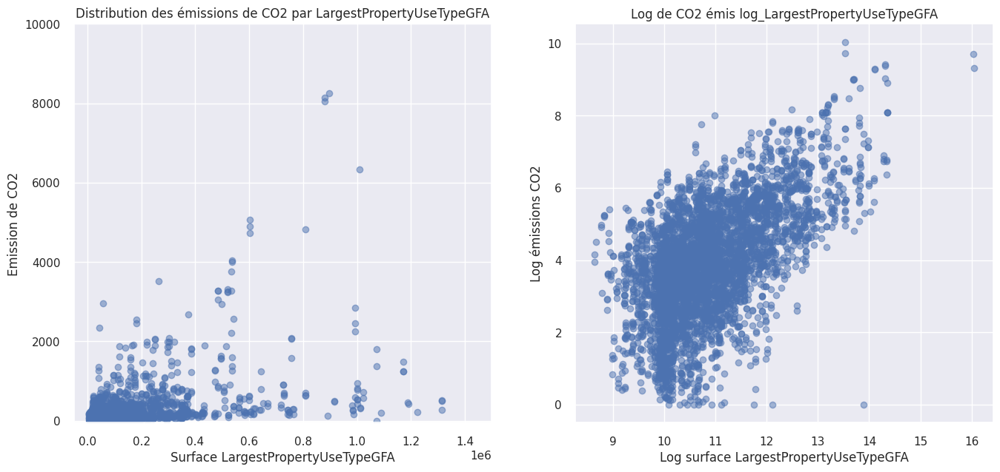

In [772]:
property_cols = ['PropertyGFATotal','PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA']
log_property_cols = ['log_PropertyGFATotal','log_PropertyGFAParking', 'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA']

for col, log_col in zip(property_cols, log_property_cols):

    fig, axes = plt.subplots(1, 2, figsize=(16,7))
    
    axes[0].scatter(df[col], df['TotalGHGEmissions'], alpha=0.5) 
    titre_1 = "Distribution des émissions de CO2 par " + col 
    axes[0].set_title(titre_1)
    x_lab_1 = "Surface " + col
    axes[0].set_xlabel(x_lab_1)
    axes[0].set_ylabel('Emission de CO2')
    axes[0].set_xlim(-50000, 1.5e6)
    axes[0].set_ylim(-50, 1e4)
    
    axes[1].scatter(df[log_col], df['log_TotalGHGEmissions'], alpha=0.5) 
    titre_2 = "Log de CO2 émis " + log_col 
    axes[1].set_title(titre_2)
    x_lab_2 = "Log surface " + col
    axes[1].set_xlabel(x_lab_2)
    axes[1].set_ylabel('Log émissions CO2')
    
    print("----------------------------------------------------------------------------------------------------------------")
    plt.show()

Les variables relatives à la surface semblent avoir un impact sur les émissions de CO2 également.

#### ENERGYSTARScore :
Visualisons la répartition de ENERGYSTARScore sur la carte de Seattle

!pip install folium

In [798]:
import folium

# Carte centrée sur Seattle
m = folium.Map(location=[47.6062, -122.3321], zoom_start=10)
df_score = df.loc[df["ENERGYSTARScore"].notna()]

for index, row in df_score.iterrows():
    latitude = row['Latitude']
    longitude = row['Longitude']
    energy_score = row['ENERGYSTARScore']
    
    # Couleur de marqueur en fonction de l'ENERGYSTARScore
    if energy_score < 50:
        color = "#eb574b"
    elif (energy_score >=50.) & (energy_score < 75.):
        color = "yellow"
    elif (energy_score >=75.) & (energy_score < 90.):
        color = "lightgreen"
    else:
        color = "green"

    # Le marqueur 
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f'Energy Star Score: {energy_score}',
    ).add_to(m)
display(m)

Les coordonnées géographiques ne semblent pas avoir d'impact sur l'Energy Star Score

#### Matrice de corrélation :

Visualisons les corrélation entre nos variables :

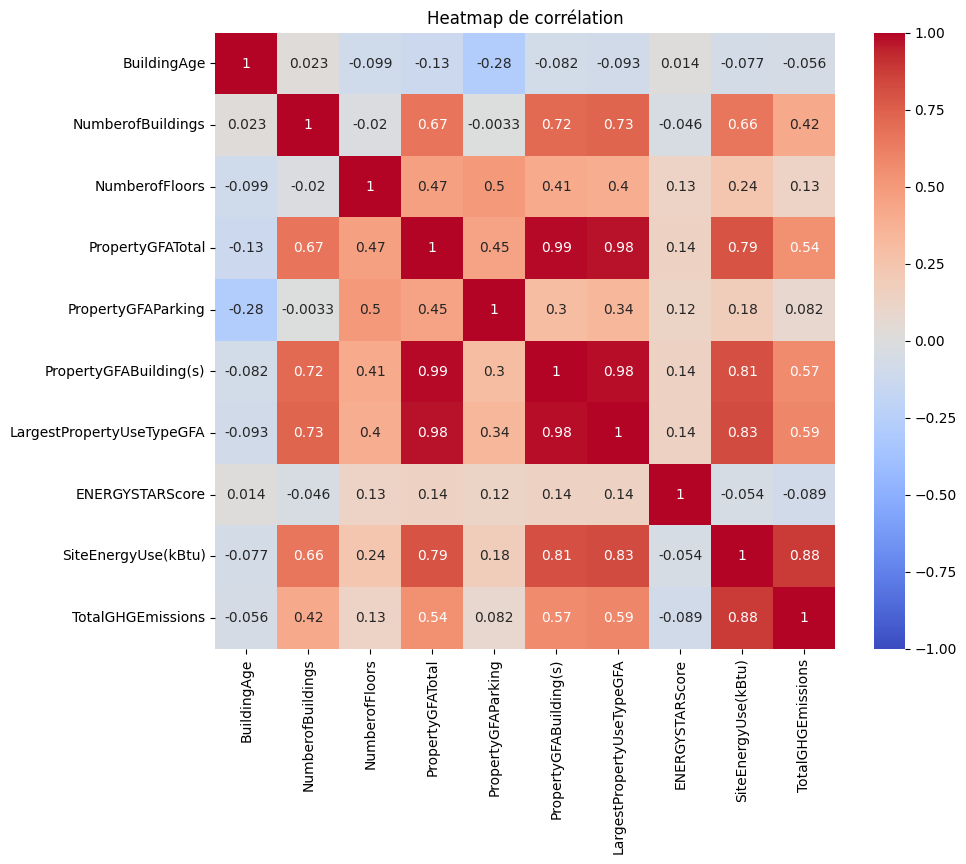

In [27]:
warnings.filterwarnings("ignore")
columns = ['BuildingAge','NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
           'LargestPropertyUseTypeGFA','ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_corr = df[columns].corr()
plt.subplots(figsize = (10,8))
sns.heatmap(df_corr, cmap = 'coolwarm', vmin=-1, vmax=1, annot=True)
plt.title('Heatmap de corrélation')
plt.show()

Nous remarquons plusieurs corrélations entre les variables :

    - Forte corrélation entre la consommation totale d'énergie et la surface totale de la propriété (0.79)
    - Très forte corrélation entre PropertyGFATotale, PropertyGFABuilding(s) et LargestPropertyUseTypeGFA (0.99 et 0.98)
    - Forte corrélation entre la consommation totale d'énergie et les émissions de CO2 (0.88)

In [805]:
df.to_csv('clean_data_2.csv', index=False)

## Feature engineering :

### a. Encodage des variables catégorielles nominales :
Nous utilisons la méthode Target encoder sur les variables suivantes : 

    - BuildingType
    - Neighborhood
    - PrimaryPropertyType
    - LargestPropertyUseType

Pour les deux dernières, nous allons comparer les performances de chacune d'entre elles pour la prédiction de nos variables cibles

Etant donné que la méthode d'encodage choisie dépend de la cible, l'encodage sera effectué séparemment dans chaque notebook de prédiction.

In [852]:
clean_data = pd.read_csv('clean_data_2.csv', sep = ",")

In [850]:
to_drop = ['DataYear', 'YearBuilt', 'log_SiteEnergyUse(kBtu)', 'log_TotalGHGEmissions', 'IQR_log_SiteEnergyUse(kBtu)', 
           'IQR_log_TotalGHGEmissions', 'log_PropertyGFATotal', 'log_PropertyGFAParking','log_PropertyGFABuilding(s)',
           'log_LargestPropertyUseTypeGFA']
clean_data = clean_data.drop(to_drop, axis=1)

In [851]:
clean_data.columns

Index(['OSEBuildingID', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'BuildingAge'],
      dtype='object')

In [854]:
clean_data.to_csv('final_data.csv', index=False)

### b. Création de nouvelles variables :

Rgarodns de près les variables :

- PropertyGFATotal
- PropertyGFAParking
- PropertyGFABuilding(s)
- LargestPropertyUseTypeGFA

In [857]:
gfa_feature = ['PropertyGFATotal', 'PropertyGFAParking' , 'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA']
clean_data[gfa_feature].describe()

,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA
count,4.766000e+03,4766.000000,4.766000e+03,4.766000e+03
mean,1.191673e+05,14587.785355,1.045795e+05,9.783926e+04
std,2.740375e+05,47244.917596,2.561917e+05,2.479660e+05
min,1.128500e+04,0.000000,3.636000e+03,5.656000e+03
25%,2.963600e+04,0.000000,2.858600e+04,2.565950e+04
50%,4.998250e+04,0.000000,4.786300e+04,4.392000e+04
75%,1.073940e+05,0.000000,9.494800e+04,9.200450e+04
max,9.320156e+06,686750.000000,9.320156e+06,9.320156e+06


Nous allons créer une colonne "Rate" pour chacune des variables : PropertyGFAParking, PropertyGFABuilding(s), LargestPropertyUseTypeGFA. 

In [859]:
clean_data["Parking_Rate"] =  (clean_data["PropertyGFAParking"] / clean_data["PropertyGFATotal"])*100
clean_data["Building_Rate"] =  (clean_data["PropertyGFABuilding(s)"] / clean_data["PropertyGFATotal"])*100
clean_data["Largest_Use_Rate"] = (clean_data["LargestPropertyUseTypeGFA"] / clean_data["PropertyGFATotal"])*100

### c. Selection de features :
Pour la selection de features pertinentes, nous allons utiliser la méthode : Recursive Feature Elimination (RFE).

Le choix des features dépendra de la cible, nous ferons donc cette étape dans le prochain notebook.

In [875]:
to_drop = clean_data.loc[(clean_data['TotalGHGEmissions']<1) | (clean_data['SiteEnergyUse(kBtu)']<1)].index
clean_data.drop(to_drop, inplace=True)
clean_data.shape

(4700, 21)

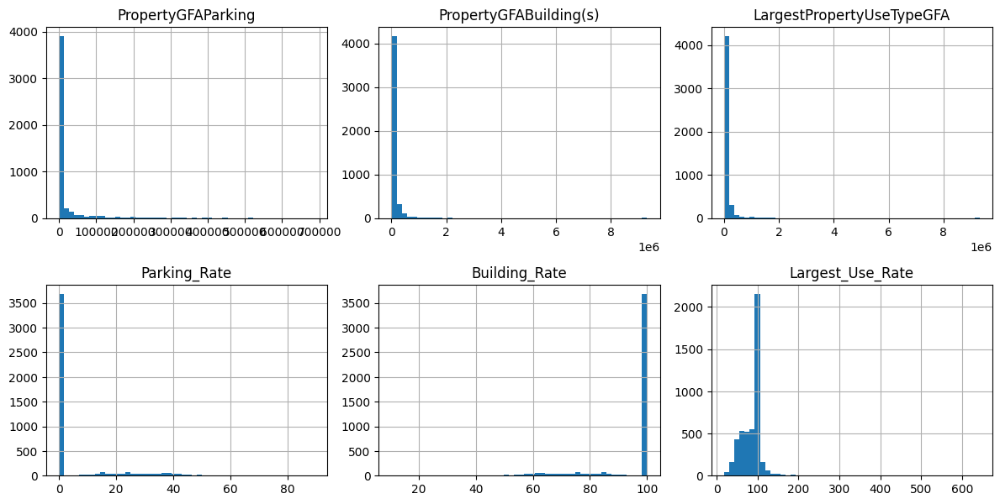

In [16]:
cols = ['PropertyGFAParking', 'PropertyGFABuilding(s)',
              'LargestPropertyUseTypeGFA', 'Parking_Rate', 'Building_Rate', 'Largest_Use_Rate']
clean_data[cols].hist(bins=50, figsize=(12, 12), layout=(4, 3)) 
plt.tight_layout()

#### Vérification des doublons avec ID du bâtiment et les variables cibles :

Nous supprimons les bâtiments ayant le même ID et la même valeur de la variable cible 

In [15]:
print("Le nombre de bâtiments doublons pour la consommation d'énergie:")
clean_data.duplicated(subset=['OSEBuildingID', 'SiteEnergyUse(kBtu)']).sum()

Le nombre de bâtiments doublons pour la consommation d'énergie:


0

In [16]:
print("Le nombre de bâtiments doublons pour les émissions de COE:")
clean_data.duplicated(subset=['OSEBuildingID', 'TotalGHGEmissions']).sum()

Le nombre de bâtiments doublons pour les émissions de COE:


2

In [17]:
df_clean = clean_data.drop_duplicates(subset=['OSEBuildingID', 'TotalGHGEmissions'], keep='first')
df_clean.shape

(4698, 21)

In [18]:
df_clean.to_csv("final_data_2.csv", index=False)